<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# DSI25 - Capstone

---

## Intro:

***

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import seaborn as sns

plt.style.use('fivethirtyeight')
sns.set(font_scale=0.8)

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
# Run only to avoid warnings for presentation purposes!
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Creating a dataframe from the original operational database
odb = pd.read_excel('datasets\_original\odb\AODB2013.xlsx', 'AODB2013')
odb

,Actual Year,Actual Month,Actual Day,Actual Hour,D/A,Terminal Num,Airline Code,Airline Name,AirCraft Type Code,AirCraft Type Name,...,Pax 1,Pax 2,Pax 3,Pax 4,Pax 5,Pax 6,Flight Count,Load Percent,Baggage Weight,Mail Weight
0,2013,1,1,3,ARR,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",763,BOEING,...,196,0,0,0,0,0,1,67.586,3327.0,NaN
1,2013,1,1,3,ARR,1,OZ,ASIANA AIRLINES,74Y,BOEING,...,0,0,0,0,0,0,1,NaN,NaN,NaN
2,2013,1,1,5,DEP,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",763,BOEING,...,258,26,2,0,4,280,1,94.667,3224.0,0.0
3,2013,1,1,6,DEP,1,OZ,ASIANA AIRLINES,74Y,BOEING,...,0,0,0,0,0,0,1,NaN,NaN,NaN
4,2013,1,1,7,ARR,2,LY,EL AL ISRAEL AIRLINES LTD,738,BOEING,...,13,1,1,0,0,14,1,8.235,244.0,173.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195288,2013,12,31,22,ARR,1,FV,"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",A81,ANTONOV,...,26,0,0,0,0,0,1,34.667,211.0,0.0
195289,2013,12,31,22,ARR,1,FV,"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",A81,ANTONOV,...,44,2,1,0,0,0,1,61.333,355.0,0.0
195290,2013,12,31,22,ARR,1,U6,"ОАО АК ""УРАЛЬСКИЕ АВИАЛИНИИ""",321,AIRBUS INDUSTRIE,...,174,24,3,0,0,198,1,104.211,2044.0,0.0
195291,2013,12,31,22,DEP,2,BT,AIR BALTIC,735,BOEING,...,73,0,0,0,0,73,1,64.035,334.0,637.0


In [3]:
odb.columns

Index(['Actual Year', 'Actual Month', 'Actual Day', 'Actual Hour', 'D/A',
       'Terminal Num', 'Airline  Code', 'Airline Name', 'AirCraft Type Code',
       'AirCraft Type Name ', 'Service Type', 'Direction Name', 'Cancellation',
       'Regularity', 'CIS Ind', 'Country Name Direct', 'Flight Number',
       'Main Delay Code', 'Source Delay', 'RunWay', 'Spot Number', 'Pax Total',
       'Pax 1', 'Pax 2', 'Pax 3', 'Pax 4', 'Pax 5', 'Pax 6', 'Flight Count',
       'Load Percent', 'Baggage Weight', 'Mail Weight'],
      dtype='object')

In [4]:
odb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195293 entries, 0 to 195292
Data columns (total 32 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Actual Year          195293 non-null  int64  
 1   Actual Month         195293 non-null  int64  
 2   Actual Day           195293 non-null  int64  
 3   Actual Hour          195293 non-null  int64  
 4   D/A                  195293 non-null  object 
 5   Terminal Num         135431 non-null  object 
 6   Airline  Code        184132 non-null  object 
 7   Airline Name         183940 non-null  object 
 8   AirCraft Type Code   137357 non-null  object 
 9   AirCraft Type Name   137357 non-null  object 
 10  Service Type         195293 non-null  object 
 11  Direction Name       195292 non-null  object 
 12  Cancellation         89 non-null      object 
 13  Regularity           195293 non-null  object 
 14  CIS Ind              20733 non-null   object 
 15  Country Name Dire

In [5]:
odb.isnull().sum()

Actual Year                 0
Actual Month                0
Actual Day                  0
Actual Hour                 0
D/A                         0
Terminal Num            59862
Airline  Code           11161
Airline Name            11353
AirCraft Type Code      57936
AirCraft Type Name      57936
Service Type                0
Direction Name              1
Cancellation           195204
Regularity                  0
CIS Ind                174560
Country Name Direct         0
Flight Number               4
Main Delay Code        162033
Source Delay           180400
RunWay                 126803
Spot Number             57927
Pax Total               72275
Pax 1                       0
Pax 2                       0
Pax 3                       0
Pax 4                       0
Pax 5                       0
Pax 6                       0
Flight Count                0
Load Percent            12846
Baggage Weight          74207
Mail Weight            112335
dtype: int64

#### First assumption
We assume that a non-null value in the 'Main Delay Code' column signals a delay.  
We have 33260 non-null values over 195293 total rows, so this means that delayed flights account for roughly 17% of the total flights.  
This figure seems in line with industry average.  


***

In [6]:
odb['Main Delay Code'].value_counts()

93     10547
99      4572
89      2499
3       1896
85      1659
       ...  
27         2
25         2
60         2
93W        1
56         1
Name: Main Delay Code, Length: 88, dtype: int64

In [7]:
odb['Main Delay Code'].value_counts(normalize=True)

93     0.317108
99     0.137462
89     0.075135
3      0.057005
85     0.049880
         ...   
27     0.000060
25     0.000060
60     0.000060
93W    0.000030
56     0.000030
Name: Main Delay Code, Length: 88, dtype: float64

In [8]:
odb['Main Delay Code'].value_counts().sum()

33260

In [9]:
odb['Main Delay Code'].unique()

array([nan, 89, 86, 15, 75, 93, 4, 46, 3, 14, 85, 99, 36, 10, 72, 18, 63,
       41, 11, 32, 5, 47, 96, 81, 87, 34, 77, 65, 31, 1, 95, 91, 43, 33,
       38, 39, 16, 29, 97, 66, 42, 19, 37, 6, 94, 68, 88, 12, 2, 92, 9,
       61, 76, 82, 51, 23, 69, 55, 71, 35, 8, 57, 62, 22, 67, 21, 70, 25,
       0, 98, 13, 27, 45, 58, 52, 28, 64, 83, 49, 17, 84, 44, 73, 60,
       '93W', 48, 24, 56, '93Y'], dtype=object)

#### We have no information about the different delay code values.

***

In [10]:
odb['Source Delay'].value_counts()

А/К     10638
ВНЕШ     3955
А/П       300
Name: Source Delay, dtype: int64

In [11]:
odb['Source Delay'].value_counts(normalize=True)

А/К     0.714295
ВНЕШ    0.265561
А/П     0.020144
Name: Source Delay, dtype: float64

In [12]:
odb.describe()

,Actual Year,Actual Month,Actual Day,Actual Hour,Pax Total,Pax 1,Pax 2,Pax 3,Pax 4,Pax 5,Pax 6,Flight Count,Load Percent,Baggage Weight,Mail Weight
count,195293.0,195293.000000,195293.000000,195293.000000,123018.000000,195293.000000,195293.000000,195293.000000,195293.000000,195293.000000,195293.000000,195293.0,182447.000000,121086.000000,82958.000000
mean,2013.0,7.246266,16.024609,13.410388,103.844649,62.046279,3.360161,0.720062,0.046453,2.024307,56.529748,1.0,81.163451,1134.466371,50.708612
std,0.0,3.082975,8.765956,6.164239,65.204536,66.526937,8.729913,2.025564,1.152120,5.212153,69.956528,0.0,41.278123,1015.762045,140.169544
min,2013.0,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000
25%,2013.0,5.000000,9.000000,9.000000,63.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,66.026000,458.000000,0.000000
50%,2013.0,7.000000,16.000000,14.000000,98.000000,54.000000,0.000000,0.000000,0.000000,0.000000,38.000000,1.0,89.474000,887.000000,0.000000
75%,2013.0,10.000000,24.000000,18.000000,130.000000,107.000000,3.000000,1.000000,0.000000,2.000000,103.000000,1.0,100.000000,1512.000000,23.000000
max,2013.0,12.000000,31.000000,23.000000,1002.000000,999.000000,425.000000,337.000000,298.000000,479.000000,605.000000,1.0,13800.000000,29117.000000,3842.000000


In [13]:
# Updating column names
odb.columns = ['year', 'month', 'day', 'hour', 'dep_arr',
       'terminal_num', 'airline_code', 'airline_name', 'aircraft_type_code',
       'aircraft_type_name', 'service_type', 'dom_int', 'cancellation',
       'regularity', 'CIS_ind', 'country_name', 'flight_number',
       'main_delay_code', 'source_delay', 'runway', 'spot_number', 'pax_total',
       'pax_1', 'pax_2', 'pax_3', 'pax_4', 'pax_5', 'pax_6', 'flight_count',
       'load_factor', 'baggage_weight', 'mail_weight']

In [14]:
odb

,year,month,day,hour,dep_arr,terminal_num,airline_code,airline_name,aircraft_type_code,aircraft_type_name,...,pax_1,pax_2,pax_3,pax_4,pax_5,pax_6,flight_count,load_factor,baggage_weight,mail_weight
0,2013,1,1,3,ARR,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",763,BOEING,...,196,0,0,0,0,0,1,67.586,3327.0,NaN
1,2013,1,1,3,ARR,1,OZ,ASIANA AIRLINES,74Y,BOEING,...,0,0,0,0,0,0,1,NaN,NaN,NaN
2,2013,1,1,5,DEP,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",763,BOEING,...,258,26,2,0,4,280,1,94.667,3224.0,0.0
3,2013,1,1,6,DEP,1,OZ,ASIANA AIRLINES,74Y,BOEING,...,0,0,0,0,0,0,1,NaN,NaN,NaN
4,2013,1,1,7,ARR,2,LY,EL AL ISRAEL AIRLINES LTD,738,BOEING,...,13,1,1,0,0,14,1,8.235,244.0,173.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195288,2013,12,31,22,ARR,1,FV,"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",A81,ANTONOV,...,26,0,0,0,0,0,1,34.667,211.0,0.0
195289,2013,12,31,22,ARR,1,FV,"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",A81,ANTONOV,...,44,2,1,0,0,0,1,61.333,355.0,0.0
195290,2013,12,31,22,ARR,1,U6,"ОАО АК ""УРАЛЬСКИЕ АВИАЛИНИИ""",321,AIRBUS INDUSTRIE,...,174,24,3,0,0,198,1,104.211,2044.0,0.0
195291,2013,12,31,22,DEP,2,BT,AIR BALTIC,735,BOEING,...,73,0,0,0,0,73,1,64.035,334.0,637.0


In [16]:
# Creating datetime column
odb['date'] = pd.to_datetime(odb[['year', 'month', 'day', 'hour']])

# Creating day-of-week column
odb['weekday'] = odb['date'].dt.dayofweek

# Removing seconds from datetime column
odb['date'] = odb['date'].apply(lambda t: t.strftime('%Y-%m-%d %H:%M'))

# Rearranging columns order
odb = odb[['date', 'year', 'month', 'day', 'weekday', 'hour', 'dep_arr',
       'terminal_num', 'airline_code', 'airline_name', 'aircraft_type_code',
       'aircraft_type_name', 'service_type', 'dom_int', 'cancellation',
       'regularity', 'CIS_ind', 'country_name', 'flight_number',
       'main_delay_code', 'source_delay', 'runway', 'spot_number', 'pax_total',
       'pax_1', 'pax_2', 'pax_3', 'pax_4', 'pax_5', 'pax_6', 'flight_count',
       'load_factor', 'baggage_weight', 'mail_weight']]

In [17]:
odb

,date,year,month,day,weekday,hour,dep_arr,terminal_num,airline_code,airline_name,...,pax_1,pax_2,pax_3,pax_4,pax_5,pax_6,flight_count,load_factor,baggage_weight,mail_weight
0,2013-01-01 03:00,2013,1,1,1,3,ARR,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",...,196,0,0,0,0,0,1,67.586,3327.0,NaN
1,2013-01-01 03:00,2013,1,1,1,3,ARR,1,OZ,ASIANA AIRLINES,...,0,0,0,0,0,0,1,NaN,NaN,NaN
2,2013-01-01 05:00,2013,1,1,1,5,DEP,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",...,258,26,2,0,4,280,1,94.667,3224.0,0.0
3,2013-01-01 06:00,2013,1,1,1,6,DEP,1,OZ,ASIANA AIRLINES,...,0,0,0,0,0,0,1,NaN,NaN,NaN
4,2013-01-01 07:00,2013,1,1,1,7,ARR,2,LY,EL AL ISRAEL AIRLINES LTD,...,13,1,1,0,0,14,1,8.235,244.0,173.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195288,2013-12-31 22:00,2013,12,31,1,22,ARR,1,FV,"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",...,26,0,0,0,0,0,1,34.667,211.0,0.0
195289,2013-12-31 22:00,2013,12,31,1,22,ARR,1,FV,"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",...,44,2,1,0,0,0,1,61.333,355.0,0.0
195290,2013-12-31 22:00,2013,12,31,1,22,ARR,1,U6,"ОАО АК ""УРАЛЬСКИЕ АВИАЛИНИИ""",...,174,24,3,0,0,198,1,104.211,2044.0,0.0
195291,2013-12-31 22:00,2013,12,31,1,22,DEP,2,BT,AIR BALTIC,...,73,0,0,0,0,73,1,64.035,334.0,637.0


In [19]:
# Creating a dataframe from the original weather dataset
weather = pd.read_csv(r'datasets\base\open-meteo-59-80N30-30E19m_mod.csv')
weather

,time,temperature_2m (°C),relativehumidity_2m (%),apparent_temperature (°C),precipitation (mm),weathercode (wmo code),windspeed_10m (km/h)
0,2013-01-01T00:00,0.9,93,-2.5,0.0,3,12.3
1,2013-01-01T01:00,0.9,93,-2.3,0.0,3,12.6
2,2013-01-01T02:00,1.0,93,-2.3,0.0,3,12.6
3,2013-01-01T03:00,0.9,94,-2.4,0.0,3,13.0
4,2013-01-01T04:00,0.9,94,-2.6,0.0,3,15.2
...,...,...,...,...,...,...,...
8755,2013-12-31T19:00,1.7,85,-2.2,0.0,2,16.3
8756,2013-12-31T20:00,1.4,85,-2.8,0.0,2,16.3
8757,2013-12-31T21:00,1.1,85,-2.9,0.0,2,15.9
8758,2013-12-31T22:00,1.2,84,-2.8,0.0,2,16.1


In [20]:
weather.columns

Index(['time', 'temperature_2m (°C)', 'relativehumidity_2m (%)',
       'apparent_temperature (°C)', 'precipitation (mm)',
       'weathercode (wmo code)', 'windspeed_10m (km/h)'],
      dtype='object')

In [21]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   time                       8760 non-null   object 
 1   temperature_2m (°C)        8760 non-null   float64
 2   relativehumidity_2m (%)    8760 non-null   int64  
 3   apparent_temperature (°C)  8760 non-null   float64
 4   precipitation (mm)         8760 non-null   float64
 5   weathercode (wmo code)     8760 non-null   int64  
 6   windspeed_10m (km/h)       8760 non-null   float64
dtypes: float64(4), int64(2), object(1)
memory usage: 479.2+ KB


In [22]:
weather.isnull().sum()

time                         0
temperature_2m (°C)          0
relativehumidity_2m (%)      0
apparent_temperature (°C)    0
precipitation (mm)           0
weathercode (wmo code)       0
windspeed_10m (km/h)         0
dtype: int64

In [23]:
# Updating column names
weather.columns = ['date', 'temperature', 'relative_humidity',
       'apparent_temperature', 'precipitation',
       'weather_code', 'wind_speed']

In [24]:
weather['date'] = weather['date'].str.replace('T', ' ')

In [25]:
weather

,date,temperature,relative_humidity,apparent_temperature,precipitation,weather_code,wind_speed
0,2013-01-01 00:00,0.9,93,-2.5,0.0,3,12.3
1,2013-01-01 01:00,0.9,93,-2.3,0.0,3,12.6
2,2013-01-01 02:00,1.0,93,-2.3,0.0,3,12.6
3,2013-01-01 03:00,0.9,94,-2.4,0.0,3,13.0
4,2013-01-01 04:00,0.9,94,-2.6,0.0,3,15.2
...,...,...,...,...,...,...,...
8755,2013-12-31 19:00,1.7,85,-2.2,0.0,2,16.3
8756,2013-12-31 20:00,1.4,85,-2.8,0.0,2,16.3
8757,2013-12-31 21:00,1.1,85,-2.9,0.0,2,15.9
8758,2013-12-31 22:00,1.2,84,-2.8,0.0,2,16.1


In [26]:
# Merge the two dataframes using the date column as key

df = pd.merge(odb, weather, how='left', on='date')

In [27]:
df

,date,year,month,day,weekday,hour,dep_arr,terminal_num,airline_code,airline_name,...,flight_count,load_factor,baggage_weight,mail_weight,temperature,relative_humidity,apparent_temperature,precipitation,weather_code,wind_speed
0,2013-01-01 03:00,2013,1,1,1,3,ARR,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",...,1,67.586,3327.0,NaN,0.9,94,-2.4,0.0,3,13.0
1,2013-01-01 03:00,2013,1,1,1,3,ARR,1,OZ,ASIANA AIRLINES,...,1,NaN,NaN,NaN,0.9,94,-2.4,0.0,3,13.0
2,2013-01-01 05:00,2013,1,1,1,5,DEP,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",...,1,94.667,3224.0,0.0,0.9,94,-2.9,0.0,3,17.0
3,2013-01-01 06:00,2013,1,1,1,6,DEP,1,OZ,ASIANA AIRLINES,...,1,NaN,NaN,NaN,0.7,94,-3.3,0.0,3,18.1
4,2013-01-01 07:00,2013,1,1,1,7,ARR,2,LY,EL AL ISRAEL AIRLINES LTD,...,1,8.235,244.0,173.0,0.8,94,-3.6,0.2,71,19.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195288,2013-12-31 22:00,2013,12,31,1,22,ARR,1,FV,"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",...,1,34.667,211.0,0.0,1.2,84,-2.8,0.0,2,16.1
195289,2013-12-31 22:00,2013,12,31,1,22,ARR,1,FV,"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",...,1,61.333,355.0,0.0,1.2,84,-2.8,0.0,2,16.1
195290,2013-12-31 22:00,2013,12,31,1,22,ARR,1,U6,"ОАО АК ""УРАЛЬСКИЕ АВИАЛИНИИ""",...,1,104.211,2044.0,0.0,1.2,84,-2.8,0.0,2,16.1
195291,2013-12-31 22:00,2013,12,31,1,22,DEP,2,BT,AIR BALTIC,...,1,64.035,334.0,637.0,1.2,84,-2.8,0.0,2,16.1


In [28]:
# Saving the modified dataframe as CSV
df.to_csv('datasets/mod/df_00.csv', encoding='utf-8', index=False)

In [29]:
# Loading the data from CSV for consistency reasons
df = pd.read_csv('datasets/mod/df_00.csv', low_memory=False)

In [30]:
df.columns

Index(['date', 'year', 'month', 'day', 'weekday', 'hour', 'dep_arr',
       'terminal_num', 'airline_code', 'airline_name', 'aircraft_type_code',
       'aircraft_type_name', 'service_type', 'dom_int', 'cancellation',
       'regularity', 'CIS_ind', 'country_name', 'flight_number',
       'main_delay_code', 'source_delay', 'runway', 'spot_number', 'pax_total',
       'pax_1', 'pax_2', 'pax_3', 'pax_4', 'pax_5', 'pax_6', 'flight_count',
       'load_factor', 'baggage_weight', 'mail_weight', 'temperature',
       'relative_humidity', 'apparent_temperature', 'precipitation',
       'weather_code', 'wind_speed'],
      dtype='object')

In [31]:
df.shape

(195293, 40)

In [32]:
# Renaming columns with binary values
df.rename(columns={'dep_arr': 'departing', 'dom_int': 'domestic', 'cancellation': 'cancelled',
                   'regularity': 'regular', 'CIS_ind': 'CIS_country'}, inplace=True)

In [33]:
df.departing.value_counts(normalize=True)
# Departing and arriving flights are almost perfectly balanced, this makes sense operationally.

DEP    0.502
ARR    0.498
Name: departing, dtype: float64

In [34]:
df.departing.value_counts().sum()
# The departing column has no empty values

195293

In [35]:
# Converting departing column into binary
df.departing[df.departing == 'DEP'] = 1
df.departing[df.departing == 'ARR'] = 0
df.head()

C:\Users\fedfi\AppData\Local\Temp\ipykernel_22904\721586472.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.departing[df.departing == 'DEP'] = 1
C:\Users\fedfi\AppData\Local\Temp\ipykernel_22904\721586472.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.departing[df.departing == 'ARR'] = 0


,date,year,month,day,weekday,hour,departing,terminal_num,airline_code,airline_name,...,flight_count,load_factor,baggage_weight,mail_weight,temperature,relative_humidity,apparent_temperature,precipitation,weather_code,wind_speed
0,2013-01-01 03:00,2013,1,1,1,3,0,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",...,1,67.586,3327.0,NaN,0.9,94,-2.4,0.0,3,13.0
1,2013-01-01 03:00,2013,1,1,1,3,0,1,OZ,ASIANA AIRLINES,...,1,NaN,NaN,NaN,0.9,94,-2.4,0.0,3,13.0
2,2013-01-01 05:00,2013,1,1,1,5,1,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",...,1,94.667,3224.0,0.0,0.9,94,-2.9,0.0,3,17.0
3,2013-01-01 06:00,2013,1,1,1,6,1,1,OZ,ASIANA AIRLINES,...,1,NaN,NaN,NaN,0.7,94,-3.3,0.0,3,18.1
4,2013-01-01 07:00,2013,1,1,1,7,0,2,LY,EL AL ISRAEL AIRLINES LTD,...,1,8.235,244.0,173.0,0.8,94,-3.6,0.2,71,19.6


In [36]:
df.terminal_num.value_counts(normalize=True)
# There are some incorrect values here

1                      0.666169
2                      0.292732
3                      0.034490
A                      0.004932
4                      0.001661
2014-02-01 00:00:00    0.000007
2014-01-02 00:00:00    0.000007
Name: terminal_num, dtype: float64

In [37]:
df.airline_code.value_counts(normalize=True)

FV     0.320721
SU     0.253291
UN     0.048297
UT     0.025433
S7     0.023581
         ...   
AHO    0.000005
IFA    0.000005
ЕШ     0.000005
HYP    0.000005
VTK    0.000005
Name: airline_code, Length: 207, dtype: float64

In [38]:
df.airline_name.value_counts(normalize=True)
# Airline names should be cleaned and translated when possible

ОАО "АВИАКОМПАНИЯ "РОССИЯ"                 0.321056
ОАО "АЭРОФЛОТ-РОССИЙСКИЕ АВИАЛИНИИ"        0.253556
АВИАКОМПАНИЯ "ТРАНСАЭРО"                   0.048347
ОАО "АВИАКОМПАНИЯ "ЮТЭЙР"                  0.025459
ОАО АВИАКОМПАНИЯ "СИБИРЬ" (S7-AIRLINES)    0.023606
                                             ...   
AIR HAMBURG PRIVATE JETS                   0.000005
ООО "АРМАВИА"                              0.000005
FAI RENT-A-JET                             0.000005
АМУРСКАЯ БАЗА АВИАЛЕСООХРАНЫ               0.000005
ОАО "АК "ВОСТОК"                           0.000005
Name: airline_name, Length: 206, dtype: float64

In [39]:
df.aircraft_type_code.value_counts(normalize=True)

32S    0.249416
320    0.116012
735    0.075104
A81    0.070699
319    0.059138
         ...   
I14    0.000015
721    0.000015
L29    0.000007
K32    0.000007
747    0.000007
Name: aircraft_type_code, Length: 174, dtype: float64

In [40]:
df.aircraft_type_name.value_counts(normalize=True)
# There are some repetitions and incorrect names.

AIRBAS INDUSTRY            0.249416
AIRBUS INDUSTRIE           0.235510
BOEING                     0.221962
ANTONOV                    0.079661
BOMBARDIER REGIONAL JET    0.058286
BOMBARDIER                 0.018951
EMBRAER                    0.017655
MIL                        0.012049
DASSAULT                   0.011030
CESSNA                     0.009464
AEROSPATIALE/ALENIA        0.008387
HAWKER BEECHCRAFT          0.008110
GULFSTREAM AEROSPACE       0.008110
LEARJET                    0.007979
FOKKER                     0.007950
TUPOLEV                    0.007550
SAAB                       0.006800
DE HAVILLAND               0.005504
YAKOVLEV                   0.005460
EUROCOPTER                 0.004900
AGUSTA                     0.003873
ROBINSON                   0.002774
ILYUSHIN                   0.001864
KAMOV                      0.001529
MCDONNELL DOUGLAS          0.001456
BEECHCRAFT                 0.000641
AGUSTA WESTLAND            0.000561
AEROSPATIALE               0

In [41]:
df.service_type.value_counts(normalize=True)

Normal Service (Sheduled, Passenger)                                0.876089
Business Aviation/Air Taxi (Others, Not Specific)                   0.047119
Passenger Only (Charter, Passenger)                                 0.038465
Helicopters (All flights)                                           0.015090
General Aviation (Others, Not specific)                             0.005883
Правительство РФ (ВИП)                                              0.004552
Non-revenue (Positioning/Ferry/Delivery/Demo; Not specific)         0.003927
Cargo and/or Mail (Charter, Cargo/Mai)                              0.003016
Normal Service (Additional Flights, Passenger)                      0.003001
Loose loaded cargo and/or preloaded devices(Sheduled,Cargo/Mail)    0.000901
Technical Test (Others, Not specific)                               0.000650
Правительство РФ (Правительства других государств)                  0.000538
State order (Гос.задание)                                           0.000297

In [42]:
df.domestic.value_counts(normalize=True)

Domestic         0.593685
International    0.406315
Name: domestic, dtype: float64

In [43]:
df.domestic.value_counts().sum()
# The domestic column has 1 empty value

195292

In [44]:
# Checking the row with the empty value, constructing a condition
d2 = df[df['domestic'].isnull()>0]
# Checking the country column
d2['country_name']
# It's an international flight

17951    FRANCE
Name: country_name, dtype: object

In [45]:
# Setting correct value for the empty cell
df.loc[df['domestic'].isnull()>0, 'domestic'] = 'International'

In [46]:
df.domestic.value_counts().sum()
# The domestic column has no empty values

195293

In [47]:
# Converting domestic column into binary
df.domestic[df.domestic == 'Domestic'] = 1
df.domestic[df.domestic == 'International'] = 0
df.head()

C:\Users\fedfi\AppData\Local\Temp\ipykernel_22904\2022611009.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.domestic[df.domestic == 'Domestic'] = 1
C:\Users\fedfi\AppData\Local\Temp\ipykernel_22904\2022611009.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.domestic[df.domestic == 'International'] = 0


,date,year,month,day,weekday,hour,departing,terminal_num,airline_code,airline_name,...,flight_count,load_factor,baggage_weight,mail_weight,temperature,relative_humidity,apparent_temperature,precipitation,weather_code,wind_speed
0,2013-01-01 03:00,2013,1,1,1,3,0,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",...,1,67.586,3327.0,NaN,0.9,94,-2.4,0.0,3,13.0
1,2013-01-01 03:00,2013,1,1,1,3,0,1,OZ,ASIANA AIRLINES,...,1,NaN,NaN,NaN,0.9,94,-2.4,0.0,3,13.0
2,2013-01-01 05:00,2013,1,1,1,5,1,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",...,1,94.667,3224.0,0.0,0.9,94,-2.9,0.0,3,17.0
3,2013-01-01 06:00,2013,1,1,1,6,1,1,OZ,ASIANA AIRLINES,...,1,NaN,NaN,NaN,0.7,94,-3.3,0.0,3,18.1
4,2013-01-01 07:00,2013,1,1,1,7,0,2,LY,EL AL ISRAEL AIRLINES LTD,...,1,8.235,244.0,173.0,0.8,94,-3.6,0.2,71,19.6


In [48]:
df.cancelled.value_counts(normalize=True)
# This column should represent a binary value

Y    1.0
Name: cancelled, dtype: float64

In [49]:
df.cancelled.value_counts().sum()
# This column should represent a binary value

89

In [50]:
# Converting cancelled column into binary
df.cancelled.fillna(0, inplace=True)
df.cancelled[df.cancelled == 'Y'] = 1

C:\Users\fedfi\AppData\Local\Temp\ipykernel_22904\2022127352.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.cancelled[df.cancelled == 'Y'] = 1


In [51]:
df.cancelled.value_counts(normalize=True)

0    0.999544
1    0.000456
Name: cancelled, dtype: float64

In [52]:
df.cancelled.value_counts().sum()
# The cancelled column has no empty values

195293

In [53]:
df.regular.value_counts(normalize=True)

Regular        0.91759
Non-Regular    0.08241
Name: regular, dtype: float64

In [54]:
df.regular.value_counts().sum()
# The regular column has no empty values

195293

In [55]:
# Converting regular column into binary
df.regular[df.regular == 'Regular'] = 1
df.regular[df.regular == 'Non-Regular'] = 0
df.head()

C:\Users\fedfi\AppData\Local\Temp\ipykernel_22904\3822208699.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.regular[df.regular == 'Regular'] = 1
C:\Users\fedfi\AppData\Local\Temp\ipykernel_22904\3822208699.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.regular[df.regular == 'Non-Regular'] = 0


,date,year,month,day,weekday,hour,departing,terminal_num,airline_code,airline_name,...,flight_count,load_factor,baggage_weight,mail_weight,temperature,relative_humidity,apparent_temperature,precipitation,weather_code,wind_speed
0,2013-01-01 03:00,2013,1,1,1,3,0,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",...,1,67.586,3327.0,NaN,0.9,94,-2.4,0.0,3,13.0
1,2013-01-01 03:00,2013,1,1,1,3,0,1,OZ,ASIANA AIRLINES,...,1,NaN,NaN,NaN,0.9,94,-2.4,0.0,3,13.0
2,2013-01-01 05:00,2013,1,1,1,5,1,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",...,1,94.667,3224.0,0.0,0.9,94,-2.9,0.0,3,17.0
3,2013-01-01 06:00,2013,1,1,1,6,1,1,OZ,ASIANA AIRLINES,...,1,NaN,NaN,NaN,0.7,94,-3.3,0.0,3,18.1
4,2013-01-01 07:00,2013,1,1,1,7,0,2,LY,EL AL ISRAEL AIRLINES LTD,...,1,8.235,244.0,173.0,0.8,94,-3.6,0.2,71,19.6


In [56]:
df.regular.value_counts(normalize=True)

1    0.91759
0    0.08241
Name: regular, dtype: float64

In [57]:
df.CIS_country.value_counts(normalize=True)
# This column should represent a binary value

Y    1.0
Name: CIS_country, dtype: float64

In [58]:
df.CIS_country.value_counts()
# This column should represent a binary value and has a lot of empty values.
# It probably indicates a flight to/from one of the 8 CIS countries: Armenia, Azerbaijan, Belarus, Kazakhstan, Kyrgyzstan, 
# Moldova, Tajikistan, Uzbekistan

Y    20733
Name: CIS_country, dtype: int64

In [59]:
# Verifying the above assumption
df[df.CIS_country == 'Y']['country_name'].value_counts()

UKRAINE                 7371
UZBEKISTAN              4078
KAZAKHSTAN              2263
BELARUS                 1791
TAJIKISTAN              1588
AZERBAIJAN              1084
KYRGYZSTAN              1022
ARMENIA                  713
MOLDOVA, REPUBLIC OF     603
TURKMENISTAN             216
GEORGIA                    4
Name: country_name, dtype: int64

In [60]:
# Converting CIS_country column into binary
df.CIS_country.fillna(0, inplace=True)
df.CIS_country[df.CIS_country == 'Y'] = 1

C:\Users\fedfi\AppData\Local\Temp\ipykernel_22904\2314804012.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.CIS_country[df.CIS_country == 'Y'] = 1


In [61]:
df.CIS_country.value_counts(normalize=True)

0    0.893836
1    0.106164
Name: CIS_country, dtype: float64

In [62]:
df.CIS_country.value_counts().sum()
# The CIS_country column has no empty values

195293

In [63]:
df.country_name.value_counts(normalize=True)
# The first two values are both domestic

RUSSIAN FEDERATION                   0.523065
RUSSIA EAST OF THE URAL MOUNTAINS    0.063484
GERMANY                              0.041333
UKRAINE                              0.037743
ITALY                                0.022223
                                       ...   
BRAZIL                               0.000005
KENYA                                0.000005
CAMBODIA                             0.000005
GRENADA                              0.000005
SEYCHELLES                           0.000005
Name: country_name, Length: 88, dtype: float64

In [64]:
# Country list need to be checked

In [65]:
df.flight_number.value_counts(normalize=True)

FV  341    0.001864
KL 1396    0.001859
FV  574    0.001859
KL 1395    0.001859
FV  641    0.001859
             ...   
OK 1884    0.000005
OK 1885    0.000005
VPC6064    0.000005
FJE188C    0.000005
SU 1796    0.000005
Name: flight_number, Length: 5660, dtype: float64

In [66]:
df.flight_number.value_counts().sum()

195289

In [67]:
len(list(df['flight_number'].unique()))

5661

In [68]:
# Main delay code and Source delay have been checked already.
# A binary column will be created for modelling purposes.

In [69]:
df['main_delay_code'].isnull().sum()

162033

In [70]:
df['main_delay_code'].value_counts().sum()

33260

In [71]:
df['main_delay_code'].value_counts()

93     10547
99      4572
89      2499
3       1896
85      1659
       ...  
27         2
25         2
60         2
93W        1
56         1
Name: main_delay_code, Length: 88, dtype: int64

In [72]:
df['main_delay_code'].value_counts(normalize=True)

93     0.317108
99     0.137462
89     0.075135
3      0.057005
85     0.049880
         ...   
27     0.000060
25     0.000060
60     0.000060
93W    0.000030
56     0.000030
Name: main_delay_code, Length: 88, dtype: float64

In [73]:
list(df['main_delay_code'].unique())

[nan,
 '89',
 '86',
 '15',
 '75',
 '93',
 '4',
 '46',
 '3',
 '14',
 '85',
 '99',
 '36',
 '10',
 '72',
 '18',
 '63',
 '41',
 '11',
 '32',
 '5',
 '47',
 '96',
 '81',
 '87',
 '34',
 '77',
 '65',
 '31',
 '1',
 '95',
 '91',
 '43',
 '33',
 '38',
 '39',
 '16',
 '29',
 '97',
 '66',
 '42',
 '19',
 '37',
 '6',
 '94',
 '68',
 '88',
 '12',
 '2',
 '92',
 '9',
 '61',
 '76',
 '82',
 '51',
 '23',
 '69',
 '55',
 '71',
 '35',
 '8',
 '57',
 '62',
 '22',
 '67',
 '21',
 '70',
 '25',
 '0',
 '98',
 '13',
 '27',
 '45',
 '58',
 '52',
 '28',
 '64',
 '83',
 '49',
 '17',
 '84',
 '44',
 '73',
 '60',
 '93W',
 '48',
 '24',
 '56',
 '93Y']

In [74]:
len(list(df['main_delay_code'].unique()))

89

In [75]:
df.main_delay_code.head(50)

0     NaN
1      89
2      86
3     NaN
4     NaN
5     NaN
6     NaN
7     NaN
8      15
9     NaN
10    NaN
11    NaN
12    NaN
13    NaN
14    NaN
15    NaN
16    NaN
17    NaN
18    NaN
19    NaN
20    NaN
21    NaN
22    NaN
23    NaN
24    NaN
25    NaN
26    NaN
27    NaN
28    NaN
29    NaN
30    NaN
31    NaN
32    NaN
33    NaN
34     75
35    NaN
36    NaN
37    NaN
38    NaN
39    NaN
40    NaN
41    NaN
42    NaN
43    NaN
44     93
45     93
46    NaN
47    NaN
48    NaN
49    NaN
Name: main_delay_code, dtype: object

In [76]:
# Trying replacing with None
df['main_delay_code'] = df['main_delay_code'].replace(np.nan, None)

In [77]:
len(list(df['main_delay_code'].unique()))

89

In [78]:
list(df['main_delay_code'].unique())

[None,
 '89',
 '86',
 '15',
 '75',
 '93',
 '4',
 '46',
 '3',
 '14',
 '85',
 '99',
 '36',
 '10',
 '72',
 '18',
 '63',
 '41',
 '11',
 '32',
 '5',
 '47',
 '96',
 '81',
 '87',
 '34',
 '77',
 '65',
 '31',
 '1',
 '95',
 '91',
 '43',
 '33',
 '38',
 '39',
 '16',
 '29',
 '97',
 '66',
 '42',
 '19',
 '37',
 '6',
 '94',
 '68',
 '88',
 '12',
 '2',
 '92',
 '9',
 '61',
 '76',
 '82',
 '51',
 '23',
 '69',
 '55',
 '71',
 '35',
 '8',
 '57',
 '62',
 '22',
 '67',
 '21',
 '70',
 '25',
 '0',
 '98',
 '13',
 '27',
 '45',
 '58',
 '52',
 '28',
 '64',
 '83',
 '49',
 '17',
 '84',
 '44',
 '73',
 '60',
 '93W',
 '48',
 '24',
 '56',
 '93Y']

In [79]:
# Creating binary column based on condition
df['delayed'] = [0 if x == None else 1 for x in df['main_delay_code']]

In [80]:
# It's working correctly now.
df.delayed.value_counts()

0    162033
1     33260
Name: delayed, dtype: int64

In [81]:
# df['delayed'] = np.where(df['main_delay_code'] == np.nan, 0, 1)

In [82]:
df.runway.value_counts(normalize=True)
# H represents the heliport.

28R    0.333625
28L    0.266331
10L    0.217097
10R    0.160870
H      0.022076
Name: runway, dtype: float64

In [83]:
df.spot_number.value_counts(normalize=True)
# This should represent the aircraft parking slot

66     0.032512
65     0.031420
67     0.030845
35     0.029906
36     0.029163
         ...   
249    0.000007
275    0.000007
220    0.000007
221    0.000007
211    0.000007
Name: spot_number, Length: 286, dtype: float64

In [84]:
df.pax_total.value_counts(normalize=True)

75.0     0.011356
0.0      0.010966
128.0    0.009600
126.0    0.009560
124.0    0.009486
           ...   
389.0    0.000008
423.0    0.000008
453.0    0.000008
408.0    0.000008
370.0    0.000008
Name: pax_total, Length: 497, dtype: float64

In [85]:
df.pax_total.value_counts().sum()

123018

In [86]:
df.pax_1.value_counts(normalize=True)

0      0.377192
116    0.005694
121    0.005663
106    0.005633
110    0.005597
         ...   
353    0.000005
499    0.000005
330    0.000005
490    0.000005
600    0.000005
Name: pax_1, Length: 498, dtype: float64

In [87]:
df.pax_1.value_counts().sum()

195293

In [88]:
df.pax_2.value_counts(normalize=True)

0      0.556461
1      0.095585
2      0.071421
3      0.052178
4      0.037364
         ...   
137    0.000005
134    0.000005
149    0.000005
131    0.000005
200    0.000005
Name: pax_2, Length: 143, dtype: float64

In [89]:
df.pax_2.value_counts().sum()

195293

In [90]:
df.pax_3.value_counts(normalize=True)

0      0.697864
1      0.142698
2      0.070561
3      0.035070
4      0.019478
5      0.011721
6      0.007415
7      0.004808
8      0.003016
9      0.002099
10     0.001475
11     0.000942
12     0.000830
13     0.000589
14     0.000312
15     0.000271
16     0.000159
17     0.000143
19     0.000123
18     0.000118
21     0.000087
20     0.000077
24     0.000020
26     0.000020
22     0.000015
31     0.000010
92     0.000010
23     0.000010
25     0.000010
337    0.000005
45     0.000005
123    0.000005
30     0.000005
78     0.000005
291    0.000005
32     0.000005
59     0.000005
230    0.000005
Name: pax_3, dtype: float64

In [91]:
df.pax_3.value_counts().sum()

195293

In [92]:
df.pax_4.value_counts(normalize=True)

0      0.990420
1      0.002181
2      0.001833
8      0.001342
3      0.001004
4      0.000881
7      0.000553
5      0.000476
6      0.000451
12     0.000389
9      0.000133
11     0.000128
10     0.000123
14     0.000020
13     0.000015
298    0.000005
259    0.000005
18     0.000005
16     0.000005
118    0.000005
15     0.000005
48     0.000005
147    0.000005
32     0.000005
102    0.000005
Name: pax_4, dtype: float64

In [93]:
df.pax_4.value_counts().sum()

195293

In [94]:
df.pax_5.value_counts(normalize=True)

0      0.684085
1      0.051364
2      0.046325
3      0.035844
4      0.029873
         ...   
49     0.000005
59     0.000005
112    0.000005
70     0.000005
56     0.000005
Name: pax_5, Length: 104, dtype: float64

In [95]:
df.pax_5.value_counts().sum()

195293

In [96]:
df.pax_6.value_counts(normalize=True)

0      0.460923
120    0.014675
119    0.007691
75     0.006447
118    0.006411
         ...   
332    0.000005
339    0.000005
432    0.000005
445    0.000005
324    0.000005
Name: pax_6, Length: 473, dtype: float64

In [97]:
df.pax_6.value_counts().sum()

195293

In [98]:
print(df.pax_total.mean())
print(df.pax_1.mean())
print(df.pax_2.mean())
print(df.pax_3.mean())
print(df.pax_4.mean())
print(df.pax_5.mean())
print(df.pax_6.mean())

103.84464875058934
62.04627918051338
3.3601613985140277
0.7200616509552313
0.046453277895265065
2.024307066817551
56.52974761000138


In [99]:
df.flight_count.value_counts(normalize=True)
# This seems a binary variable

1    1.0
Name: flight_count, dtype: float64

In [100]:
df.flight_count.value_counts()
# This seems a binary variable, but it's always equal to 1 so it could be dropped

1    195293
Name: flight_count, dtype: int64

In [101]:
df.shape

(195293, 41)

In [102]:
df.drop(columns=['flight_count'], inplace=True)
df.shape

(195293, 40)

In [103]:
df.load_factor.value_counts(normalize=True)
# Load factor it's a percentage, some values are incorrect.

100.000    0.342461
0.000      0.005207
75.000     0.005180
66.667     0.004703
50.000     0.004637
             ...   
40.708     0.000005
273.636    0.000005
192.982    0.000005
193.860    0.000005
52.857     0.000005
Name: load_factor, Length: 4162, dtype: float64

In [136]:
df[df.load_factor > 100]

,date,year,month,day,weekday,hour,departing,terminal_num,airline_code,airline_name,...,load_factor,baggage_weight,mail_weight,temperature,relative_humidity,apparent_temperature,precipitation,weather_code,wind_speed,delayed
6,2013-01-01 09:00,2013,1,1,1,9,1.0,1,R2,"ОАО ""ОРЕНБУРГСКИЕ АВИАЛИНИИ""",...,110.588,1847.0,NaN,1.0,92,-3.7,0.1,71,21.0,0
11,2013-01-01 10:00,2013,1,1,1,10,1.0,1,FV,"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",...,110.897,1592.0,NaN,0.9,93,-3.7,0.4,73,20.5,0
36,2013-01-01 14:00,2013,1,1,1,14,1.0,2,7K,"ООО ""АВИАКОМПАНИЯ КОГАЛЫМАВИА""",...,114.211,2062.0,0.0,1.4,96,-2.8,0.5,71,18.4,0
75,2013-01-01 17:00,2013,1,1,1,17,1.0,2,OS,AUSTRIAN AIRLINES,...,103.846,1905.0,NaN,1.8,97,-2.0,0.4,51,17.7,1
81,2013-01-01 18:00,2013,1,1,1,18,1.0,2,SK,SAS-SCANDINAVIAN AIRLINES,...,100.833,1439.0,NaN,2.1,95,-1.6,0.2,51,17.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195159,2013-12-31 16:00,2013,12,31,1,16,1.0,2,LX,SWISS,...,103.205,1878.0,0.0,2.6,86,-0.8,0.0,3,15.1,0
195164,2013-12-31 16:00,2013,12,31,1,16,1.0,2,PS,AIR UKRAINE INTERNATIONAL,...,122.807,1117.0,NaN,2.6,86,-0.8,0.0,3,15.1,0
195249,2013-12-31 19:00,2013,12,31,1,19,1.0,2,KL,KLM-ROYAL DUTCH AIRLINES,...,100.588,NaN,NaN,1.7,85,-2.2,0.0,2,16.3,0
195258,2013-12-31 19:00,2013,12,31,1,19,0.0,1,S7,"ОАО АВИАКОМПАНИЯ ""СИБИРЬ"" (S7-AIRLINES)",...,108.947,1456.0,0.0,1.7,85,-2.2,0.0,2,16.3,0


#### There are 7737 flights with a load factor bigger than 100%.  
We assume this as an error, and we impute a 100% load factor to these flights.

***

In [ ]:
# Imputing a different load factor



In [104]:
df.load_factor.mean()

81.16345147357833

In [105]:
df.baggage_weight.value_counts(normalize=True)

0.0       0.015815
650.0     0.000917
493.0     0.000917
468.0     0.000859
600.0     0.000859
            ...   
3389.0    0.000008
3308.0    0.000008
4939.0    0.000008
4053.0    0.000008
9405.0    0.000008
Name: baggage_weight, Length: 5730, dtype: float64

In [106]:
df.baggage_weight.mean()

1134.466371009035

In [107]:
df.mail_weight.value_counts(normalize=True)

0.0       0.685672
1.0       0.007100
4.0       0.003532
2.0       0.003508
19.0      0.003460
            ...   
1875.0    0.000012
769.0     0.000012
631.0     0.000012
951.0     0.000012
1471.0    0.000012
Name: mail_weight, Length: 1164, dtype: float64

In [108]:
df.mail_weight.mean()

50.70861158658598

In [109]:
df.temperature.mean()

9.103383121770076

In [110]:
df.relative_humidity.mean()

78.2486827484856

In [111]:
df.apparent_temperature.mean()

6.827354795102535

In [112]:
df.precipitation.mean()

0.08476135857405524

In [113]:
df.weather_code.value_counts(normalize=True)

3     0.289928
1     0.202071
0     0.188389
2     0.143379
51    0.086557
53    0.034082
71    0.030733
61    0.013073
73    0.008367
63    0.003421
Name: weather_code, dtype: float64

In [114]:
df.wind_speed.mean()

11.967680357207776

In [115]:
df.isnull().sum()

date                         0
year                         0
month                        0
day                          0
weekday                      0
hour                         0
departing                    0
terminal_num             59862
airline_code             11161
airline_name             11353
aircraft_type_code       57936
aircraft_type_name       57936
service_type                 0
domestic                     0
cancelled                    0
regular                      0
CIS_country                  0
country_name                 0
flight_number                4
main_delay_code         162033
source_delay            180400
runway                  126803
spot_number              57927
pax_total                72275
pax_1                        0
pax_2                        0
pax_3                        0
pax_4                        0
pax_5                        0
pax_6                        0
load_factor              12846
baggage_weight           74207
mail_wei

In [116]:
# Encoding binary columns as number
df['departing'] = df['departing'].astype(float)
df['domestic'] = df['domestic'].astype(float)
df['cancelled'] = df['cancelled'].astype(float)
df['regular'] = df['regular'].astype(float)
df['CIS_country'] = df['CIS_country'].astype(float)

In [117]:
df.dtypes

date                     object
year                      int64
month                     int64
day                       int64
weekday                   int64
hour                      int64
departing               float64
terminal_num             object
airline_code             object
airline_name             object
aircraft_type_code       object
aircraft_type_name       object
service_type             object
domestic                float64
cancelled               float64
regular                 float64
CIS_country             float64
country_name             object
flight_number            object
main_delay_code          object
source_delay             object
runway                   object
spot_number              object
pax_total               float64
pax_1                     int64
pax_2                     int64
pax_3                     int64
pax_4                     int64
pax_5                     int64
pax_6                     int64
load_factor             float64
baggage_

In [118]:
# Saving the modified dataframe as CSV
df.to_csv('datasets/mod/df_01.csv', encoding='utf-8', index=False)

## Performing EDA
Quantitative description and visualisation of the data.




***

In [3]:
# Loading the data from CSV for consistency reasons
df = pd.read_csv('datasets/mod/df_01.csv', low_memory=False)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195293 entries, 0 to 195292
Data columns (total 40 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   date                  195293 non-null  object 
 1   year                  195293 non-null  int64  
 2   month                 195293 non-null  int64  
 3   day                   195293 non-null  int64  
 4   weekday               195293 non-null  int64  
 5   hour                  195293 non-null  int64  
 6   departing             195293 non-null  float64
 7   terminal_num          135431 non-null  object 
 8   airline_code          184132 non-null  object 
 9   airline_name          183940 non-null  object 
 10  aircraft_type_code    137357 non-null  object 
 11  aircraft_type_name    137357 non-null  object 
 12  service_type          195293 non-null  object 
 13  domestic              195293 non-null  float64
 14  cancelled             195293 non-null  float64
 15  

In [5]:
df.shape

(195293, 40)

In [122]:
df.describe()

,year,month,day,weekday,hour,departing,domestic,cancelled,regular,CIS_country,...,load_factor,baggage_weight,mail_weight,temperature,relative_humidity,apparent_temperature,precipitation,weather_code,wind_speed,delayed
count,195293.0,195293.000000,195293.000000,195293.000000,195293.000000,195293.000000,195293.000000,195293.000000,195293.000000,195293.000000,...,182447.000000,121086.000000,82958.000000,195293.000000,195293.000000,195293.000000,195293.000000,195293.000000,195293.000000,195293.000000
mean,2013.0,7.246266,16.024609,3.009345,13.410388,0.502000,0.593682,0.000456,0.917590,0.106164,...,81.163451,1134.466371,50.708612,9.103383,78.248683,6.827355,0.084761,11.385155,11.967680,0.170308
std,0.0,3.082975,8.765956,2.002745,6.164239,0.499997,0.491146,0.021343,0.274988,0.308048,...,41.278123,1015.762045,140.169544,9.662356,15.507387,11.554376,0.317358,21.362831,5.552934,0.375904
min,2013.0,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,-25.200000,29.000000,-32.900000,0.000000,0.000000,0.000000,0.000000
25%,2013.0,5.000000,9.000000,1.000000,9.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,66.026000,458.000000,0.000000,2.200000,67.000000,-1.600000,0.000000,1.000000,7.700000,0.000000
50%,2013.0,7.000000,16.000000,3.000000,14.000000,1.000000,1.000000,0.000000,1.000000,0.000000,...,89.474000,887.000000,0.000000,10.200000,82.000000,7.500000,0.000000,2.000000,11.400000,0.000000
75%,2013.0,10.000000,24.000000,5.000000,18.000000,1.000000,1.000000,0.000000,1.000000,0.000000,...,100.000000,1512.000000,23.000000,17.000000,91.000000,16.100000,0.000000,3.000000,15.500000,0.000000
max,2013.0,12.000000,31.000000,6.000000,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,13800.000000,29117.000000,3842.000000,30.600000,100.000000,34.500000,5.600000,73.000000,37.800000,1.000000


In [123]:
df.columns

Index(['date', 'year', 'month', 'day', 'weekday', 'hour', 'departing',
       'terminal_num', 'airline_code', 'airline_name', 'aircraft_type_code',
       'aircraft_type_name', 'service_type', 'domestic', 'cancelled',
       'regular', 'CIS_country', 'country_name', 'flight_number',
       'main_delay_code', 'source_delay', 'runway', 'spot_number', 'pax_total',
       'pax_1', 'pax_2', 'pax_3', 'pax_4', 'pax_5', 'pax_6', 'load_factor',
       'baggage_weight', 'mail_weight', 'temperature', 'relative_humidity',
       'apparent_temperature', 'precipitation', 'weather_code', 'wind_speed',
       'delayed'],
      dtype='object')

In [124]:
# Defining variable categories
continuous_vars = ['pax_total', 'pax_1', 'pax_2', 'pax_3', 'pax_4', 'pax_5', 'pax_6', 'load_factor', 'baggage_weight',
                   'mail_weight', 'temperature', 'relative_humidity', 'apparent_temperature', 'precipitation',
                   'wind_speed']

discrete_vars = ['date', 'month', 'day', 'weekday', 'hour']

ordinal_vars = []

nominal_vars = ['terminal_num', 'airline_code', 'airline_name', 'aircraft_type_code', 'aircraft_type_name',
                'service_type', 'country_name', 'flight_number', 'main_delay_code', 'source_delay', 'runway',
                'spot_number', 'weather_code']

binary_vars = ['departing', 'domestic', 'cancelled', 'regular', 'CIS_country']

quant_vars = continuous_vars + discrete_vars

categ_vars = ordinal_vars + nominal_vars + binary_vars

delay = ['delayed']

# The variable 'year' has been excluded because it only contains one value

In [125]:
print('Continuous variables:', len(continuous_vars))
print('Discrete variables:  ', len(discrete_vars))
print('Ordinal variables:   ', len(ordinal_vars))
print('Nominal variables:   ', len(nominal_vars))
print('Binary variables:    ', len(binary_vars))

Continuous variables: 15
Discrete variables:   5
Ordinal variables:    0
Nominal variables:    13
Binary variables:     5


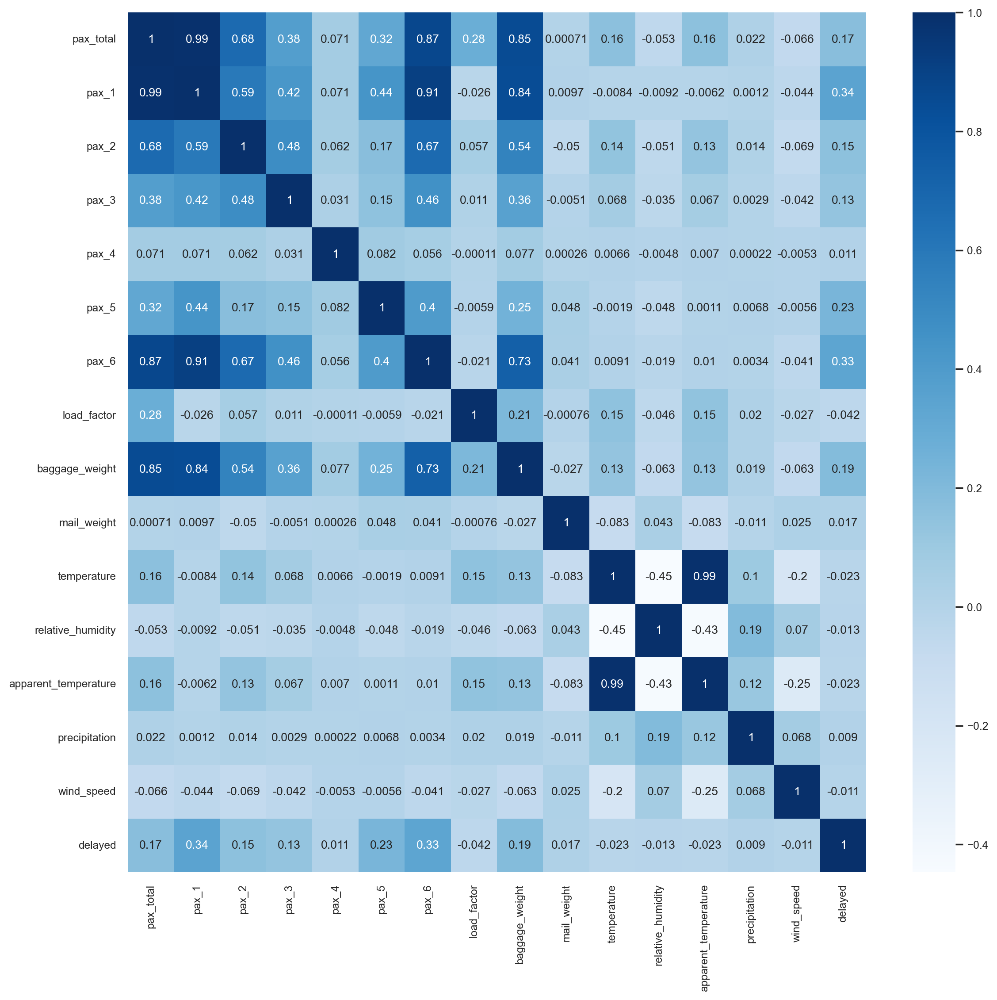

In [99]:
# exploring correlations between continuous variables and delay
plt.figure(figsize=(12, 12))
sns.heatmap(df[continuous_vars+delay].corr(), cmap='Blues', annot=True)
plt.show()

In [126]:
cont_vars_sub = ['pax_1', 'pax_6', 'pax_5', 'baggage_weight']

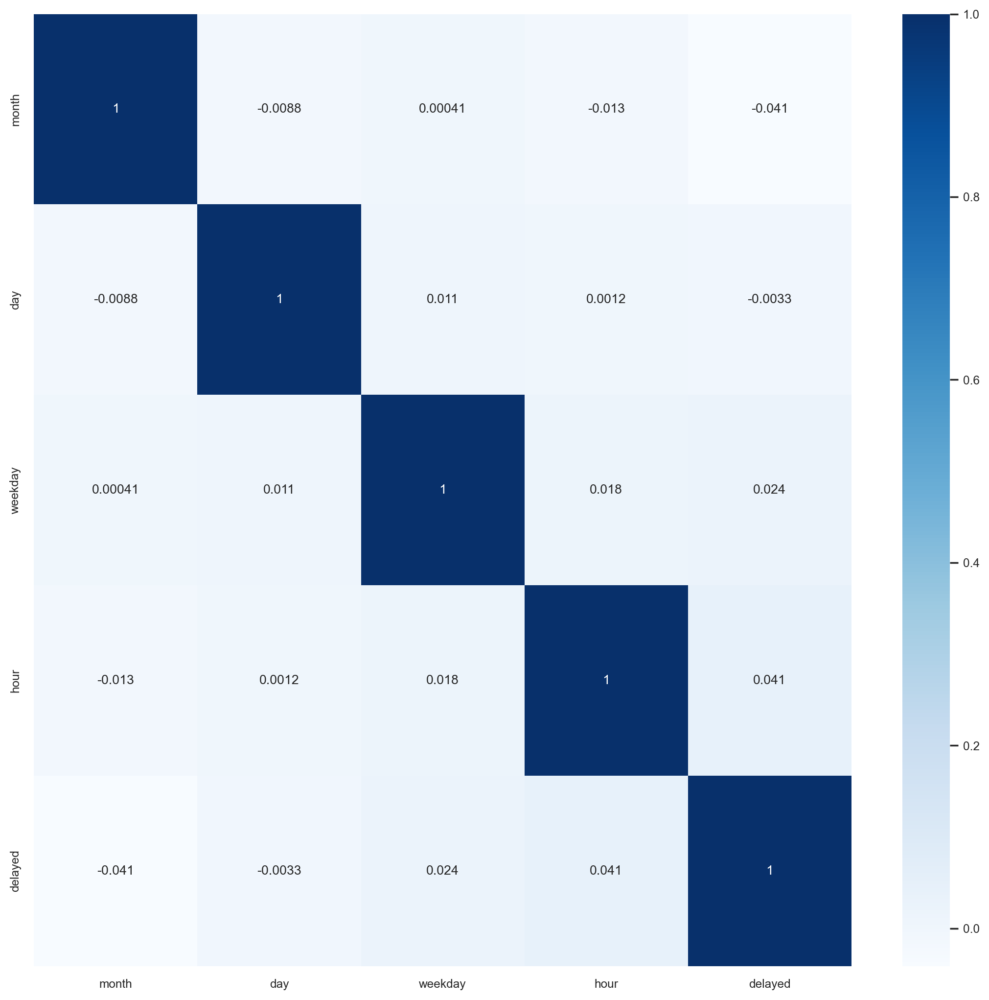

In [127]:
# exploring correlations between discrete variables and delay
plt.figure(figsize=(12, 12))
sns.heatmap(df[discrete_vars+delay].corr(), cmap='Blues', annot=True)
plt.show()

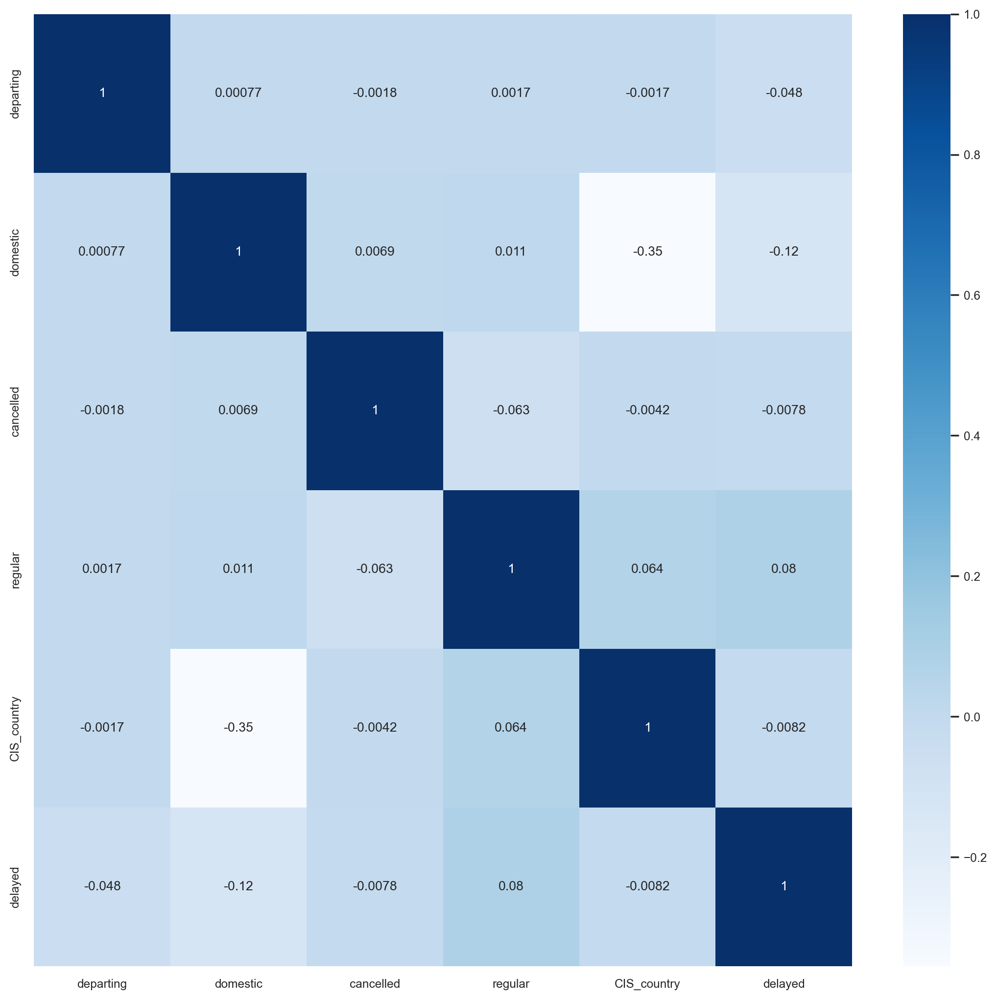

In [102]:
plt.figure(figsize=(12, 12))
sns.heatmap(df[binary_vars+delay].corr(), cmap='Blues', annot=True)
plt.show()

In [200]:
sns.pairplot(df[continuous_vars+delay])
plt.show()

<Figure size 1500x1500 with 0 Axes>

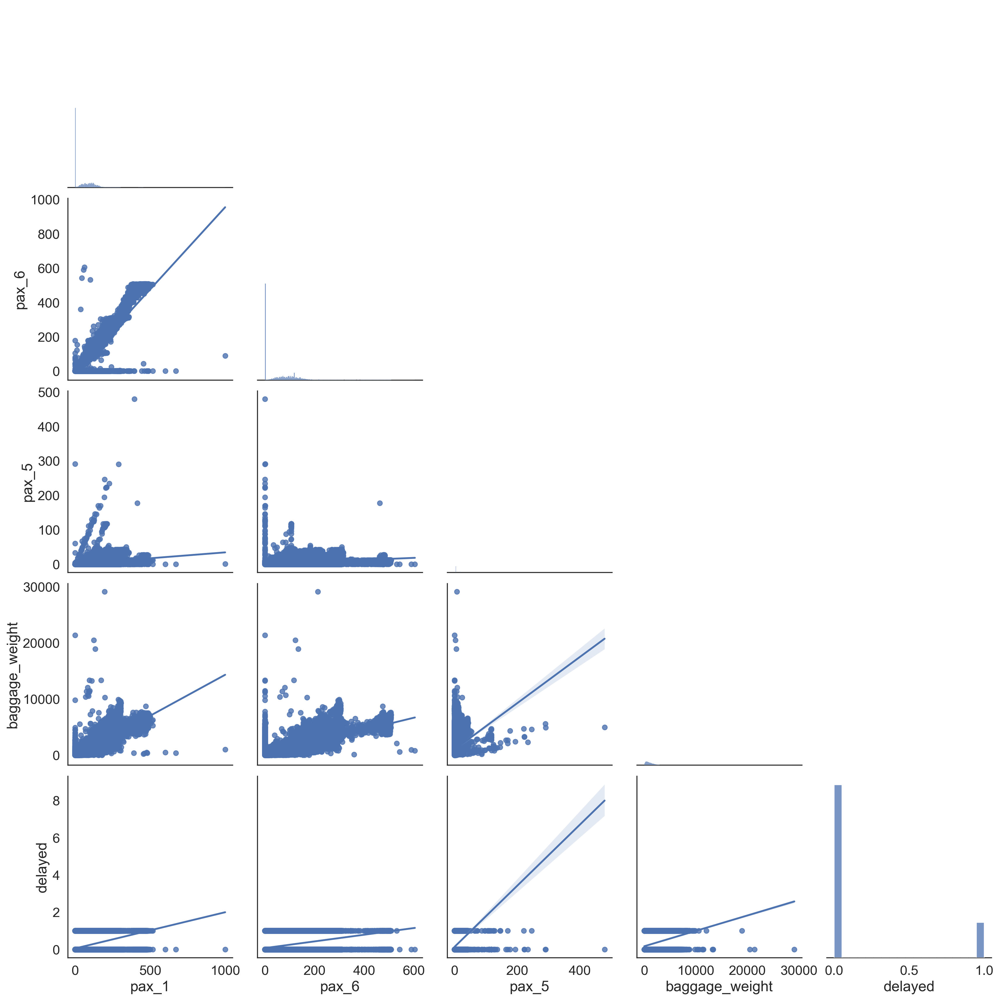

In [103]:
sns.set_theme(style='white' , font_scale=1.5)

plt.figure(figsize=(15, 15))

sns.pairplot(df[cont_vars_sub+delay], kind='reg', height=3.5, plot_kws=dict(marker="o"),diag_kws=dict(fill=True),
             corner=True);

In [128]:
def var_standardized(var):
    var_stand = (var-var.mean())/var.std()
    return var_stand

In [129]:
df_stand = var_standardized(df[continuous_vars+discrete_vars+binary_vars])

C:\Users\fedfi\AppData\Local\Temp\ipykernel_22904\781896086.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  var_stand = (var-var.mean())/var.std()


In [130]:
df_stand

,CIS_country,apparent_temperature,baggage_weight,cancelled,date,day,departing,domestic,hour,load_factor,...,pax_4,pax_5,pax_6,pax_total,precipitation,regular,relative_humidity,temperature,weekday,wind_speed
0,-0.344634,-0.798603,2.158511,-0.021353,NaN,-1.713973,-1.004005,-1.208768,-1.688836,-0.328926,...,-0.04032,-0.388382,-0.808070,1.413327,-0.267084,0.299684,1.015730,-0.849004,-1.003295,0.185905
1,-0.344634,-0.798603,NaN,-0.021353,NaN,-1.713973,-1.004005,-1.208768,-1.688836,NaN,...,-0.04032,-0.388382,-0.808070,NaN,-0.267084,-3.336835,1.015730,-0.849004,-1.003295,0.185905
2,-0.344634,-0.841876,2.057109,-0.021353,NaN,-1.713973,0.996006,-1.208768,-1.364384,0.327136,...,-0.04032,0.379055,3.194416,2.762927,-0.267084,0.299684,1.015730,-0.849004,-1.003295,0.906245
3,-0.344634,-0.876495,NaN,-0.021353,NaN,-1.713973,0.996006,-1.208768,-1.202158,NaN,...,-0.04032,-0.388382,-0.808070,NaN,-0.267084,-3.336835,1.015730,-0.869703,-1.003295,1.104339
4,-0.344634,-0.902459,-0.876649,-0.021353,NaN,-1.713973,-1.004005,-1.208768,-1.039932,-1.766758,...,-0.04032,-0.388382,-0.607945,-1.377890,0.363119,0.299684,1.015730,-0.859354,-1.003295,1.374466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195288,-0.344634,-0.833222,-0.909137,-0.021353,NaN,1.708358,-1.004005,0.827284,1.393459,-1.126419,...,-0.04032,-0.388382,-0.808070,-1.193853,-0.267084,0.299684,0.370876,-0.817956,-1.003295,0.744169
195289,-0.344634,-0.833222,-0.767371,-0.021353,NaN,1.708358,-1.004005,0.827284,1.393459,-0.480411,...,-0.04032,-0.388382,-0.808070,-0.887126,-0.267084,0.299684,0.370876,-0.817956,-1.003295,0.744169
195290,-0.344634,-0.833222,0.895420,-0.021353,NaN,1.708358,-1.004005,-1.208768,1.393459,0.558348,...,-0.04032,-0.388382,2.022259,1.444000,-0.267084,0.299684,0.370876,-0.817956,-1.003295,0.744169
195291,-0.344634,-0.833222,-0.788045,-0.021353,NaN,1.708358,0.996006,-1.208768,1.393459,-0.414952,...,-0.04032,-0.388382,0.235436,-0.473045,-0.267084,0.299684,0.370876,-0.817956,-1.003295,0.744169


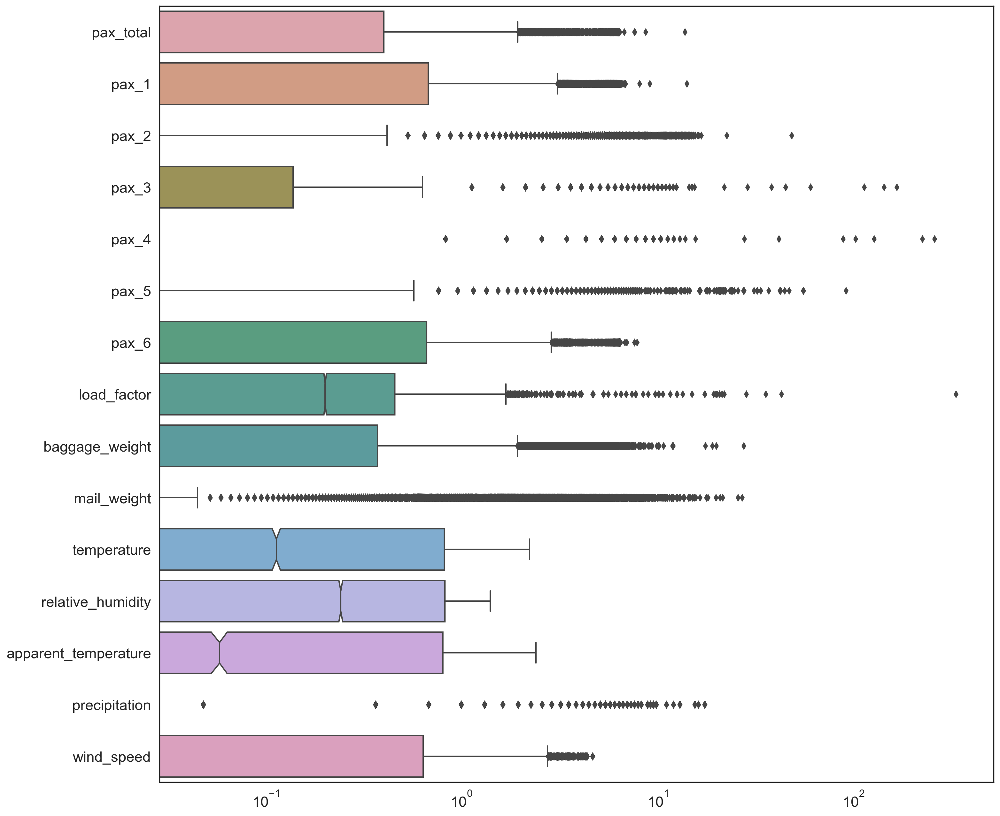

In [221]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.boxplot(data=df_stand[continuous_vars], orient='h', fliersize=5,
            linewidth=1.5, notch=True, saturation=0.5, ax=ax)
plt.xscale('log')
plt.show()

In [37]:
# df.hist(figsize=(12, 20))
# plt.tight_layout()
# plt.show()

In [38]:
# df_stand.hist(figsize=(12, 20))
# plt.tight_layout()
# plt.show()

In [140]:
delay = df[df.delayed == 1]
nodelay = df[df.delayed == 0]

In [142]:
# What's the time of the day with the most delays? Absolute
time_abs = delay.groupby('hour').count().sort_values(by='delayed', ascending=False)[['delayed']]
time_abs

,delayed
hour,
17,2805
16,2485
18,2259
15,2240
22,1867
21,1835
23,1797
20,1781
14,1683


In [145]:
# What's the time of the day with the most delays? Relative
time_rel = time_abs / df.groupby('hour').count()[['delayed']]
time_rel.sort_values(by='delayed', ascending=False)

,delayed
hour,
3,0.345411
1,0.273223
2,0.259434
4,0.258368
17,0.239498
23,0.230385
0,0.220222
16,0.200597
18,0.198541


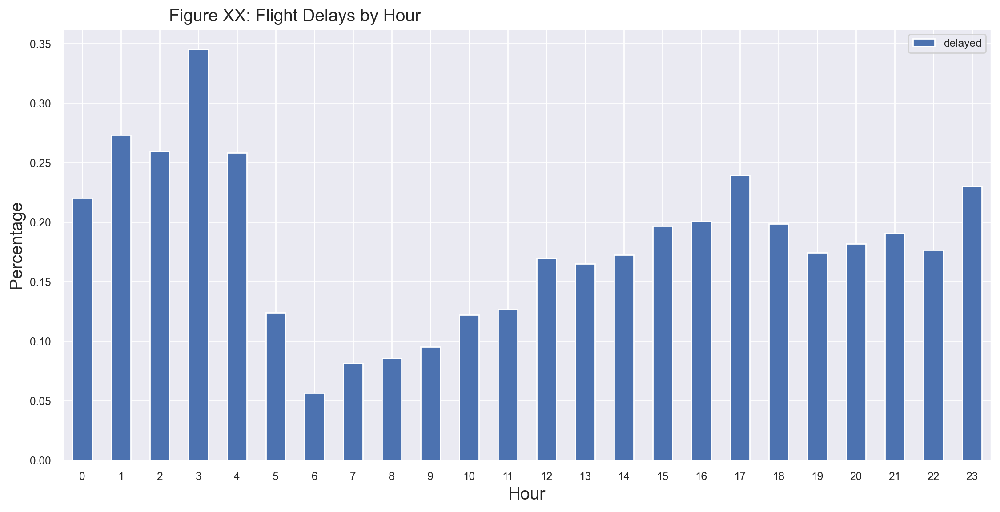

In [184]:
time_rel.plot(kind='bar', rot=0, figsize=(12,6))
plt.title('Figure XX: Flight Delays by Hour', x = 0.25, fontsize = 14)
plt.ylabel('Percentage', fontsize = 14)
plt.xlabel('Hour', fontsize = 14)
plt.show()

The graph above shows that **3am** has relatively the most delays during the day, while **6am** has the least.  
  
  ***

In [149]:
# What's the day of the week with the most delays? Absolute
day_abs = delay.groupby('weekday').count().sort_values(by='delayed', ascending=False)[['delayed']]
day_abs
# 0 is Monday

,delayed
weekday,
4,5569
5,5111
6,4926
0,4783
2,4633
3,4348
1,3890


In [151]:
# What's the day of the week with the most delays? Relative
day_rel = day_abs / df.groupby('weekday').count()[['delayed']]
day_rel.sort_values(by='delayed', ascending=False)

,delayed
weekday,
5,0.189402
4,0.188180
6,0.174057
0,0.167525
2,0.166361
3,0.158437
1,0.146406


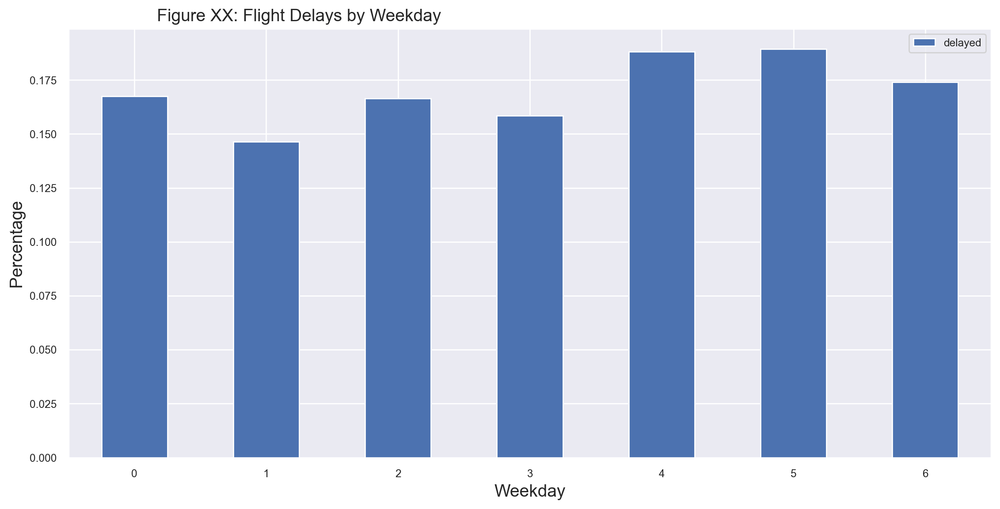

In [183]:
day_rel.plot(kind='bar', rot=0, figsize=(12,6))
plt.title('Figure XX: Flight Delays by Weekday', x = 0.25, fontsize = 14)
plt.ylabel('Percentage', fontsize = 14)
plt.xlabel('Weekday', fontsize = 14)
plt.show()

The graph above shows that **Saturday** has relatively the most delays during the week, while **Tuesday** has the least.  
  
  ***

In [153]:
# What's the month of the year with the most delays? Absolute
month_abs = delay.groupby('month').count().sort_values(by='delayed', ascending=False)[['delayed']]
month_abs

,delayed
month,
6,3799
7,3646
9,3599
8,3576
12,3114
10,2820
5,2444
11,2185
3,2158


In [154]:
# What's the month of the year with the most delays? Relative
month_rel = month_abs / df.groupby('month').count()[['delayed']]
month_rel.sort_values(by='delayed', ascending=False)

,delayed
month,
1,0.233462
3,0.228336
2,0.218028
9,0.186728
6,0.183642
12,0.177770
7,0.171625
8,0.160582
4,0.157160


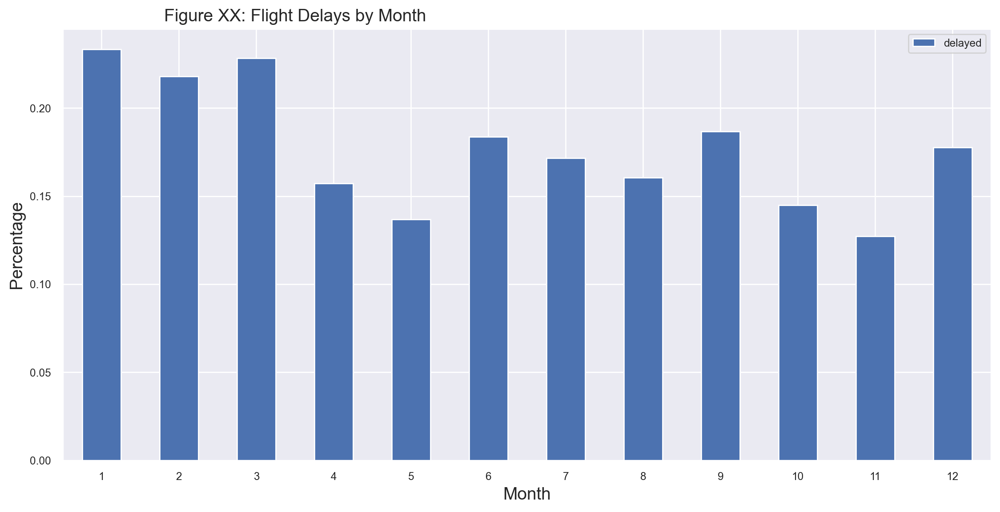

In [182]:
month_rel.plot(kind='bar', rot=0, figsize=(12,6))
plt.title('Figure XX: Flight Delays by Month', x = 0.25, fontsize = 14)
plt.ylabel('Percentage', fontsize = 14)
plt.xlabel('Month', fontsize = 14)
plt.show()

The graph above shows that **January** has relatively the most delays during the year, while **November** has the least.  
  
  ***

In [156]:
# What's the airline with the most delays? Absolute
airline_abs = delay.groupby('airline_name').count().sort_values(by='delayed', ascending=False)[['delayed']]
airline_abs

,delayed
airline_name,
"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",8036
"ОАО ""АЭРОФЛОТ-РОССИЙСКИЕ АВИАЛИНИИ""",4439
"АВИАКОМПАНИЯ ""ТРАНСАЭРО""",2745
LUFTHANSA GERMAN AIRLINES,2139
"ОАО АВИАКОМПАНИЯ ""СИБИРЬ"" (S7-AIRLINES)",896
...,...
NIKI,1
UKRAINE AIR ALLIANCE,1
HAMBURG AIRWAYS,1


In [158]:
# What's the airline with the most delays? Relative
airline_rel = airline_abs / df.groupby('airline_name').count()[['delayed']]
airline_rel.sort_values(by='delayed', ascending=False)

,delayed
airline_name,
"ООО ""АВИАКОМПАНИЯ ""ТУЛПАР""",1.000000
ATLAS JET HAVACILIC,1.000000
"ЗАО ""АВИАКОМПАНИЯ АЭРОСВИТ""",0.846154
"ООО ""АВИАКОМПАНИЯ ""ИКАР""",0.800000
KLM-ROYAL DUTCH AIRLINES,0.670330
...,...
"ООО ""АРМАВИА""",NaN
"ООО АК ""АВИАСТАР-ТУ""",NaN
"ООО АК ""БАРКОЛ""",NaN


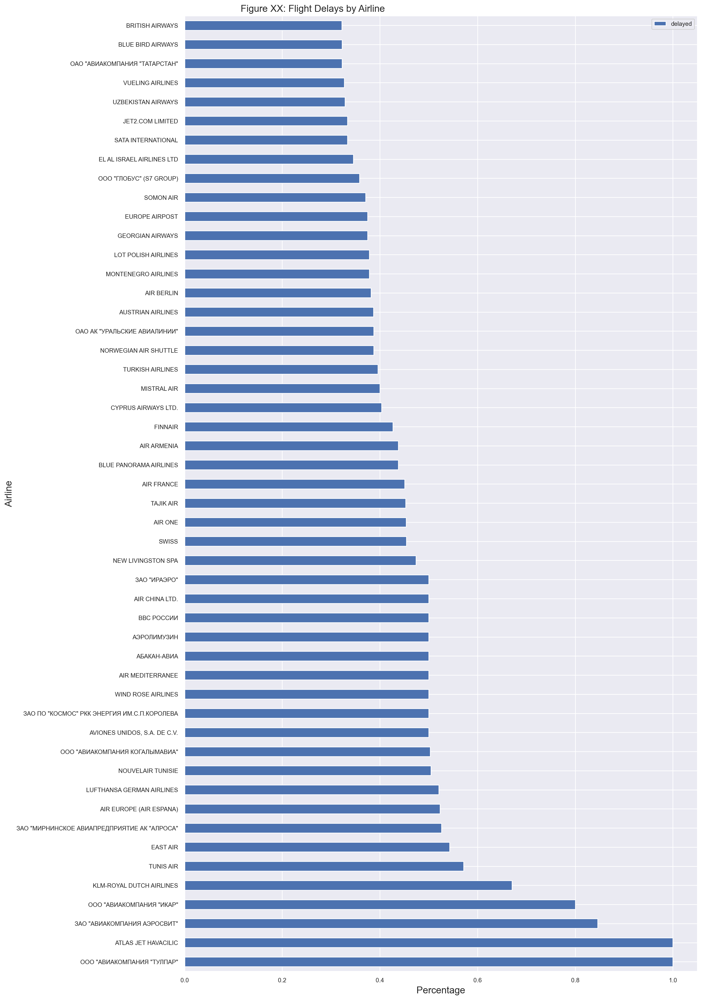

In [181]:
airline_rel.sort_values(by='delayed', ascending=False).head(50).plot(kind='barh', rot=0, figsize=(12,24))
plt.title('Figure XX: Flight Delays by Airline', x = 0.25, fontsize = 14)
plt.ylabel('Airline', fontsize = 14)
plt.xlabel('Percentage', fontsize = 14)
plt.show()

The graph above shows that **АВИАКОМПАНИЯ "ТУЛПАР"** has relatively the most delays among the airlines.  
  
  ***

In [170]:
# What's the aircraft type with the most delays? Absolute
aircraft_abs = delay.groupby(['aircraft_type_name','aircraft_type_code']).count().sort_values(by='delayed', ascending=False)[['delayed']]
aircraft_abs


delayed
aircraft_type_name   aircraft_type_code         
AIRBUS INDUSTRIE     320                    6449
AIRBAS INDUSTRY      32S                    6079
AIRBUS INDUSTRIE     321                    3513
                     319                    2489
BOEING               735                    2028
...                                          ...
LEARJET              LR5                       1
                     LR3                       1
                     LJ5                       1
GULFSTREAM AEROSPACE GRJ                       1
PIAGGIO              P18                       1

[122 rows x 1 columns]

In [171]:
# What's the aircraft type with the most delays? Relative
aircraft_rel = aircraft_abs / df.groupby(['aircraft_type_name','aircraft_type_code']).count()[['delayed']]
aircraft_rel.sort_values(by='delayed', ascending=False)


delayed
aircraft_type_name  aircraft_type_code          
AEROSPATIALE/ALENIA AT4                 1.000000
TUPOLEV             T24                 0.653846
AIRBUS INDUSTRIE    313                 0.647727
BOEING              739                 0.557562
                    73H                 0.545455
...                                          ...
ROBINSON            R66                      NaN
ROCKWELL            SBR1                     NaN
SOCATA              TB7                      NaN
TRANSAL             C16                      NaN
VIRUS               PIVI                     NaN

[174 rows x 1 columns]

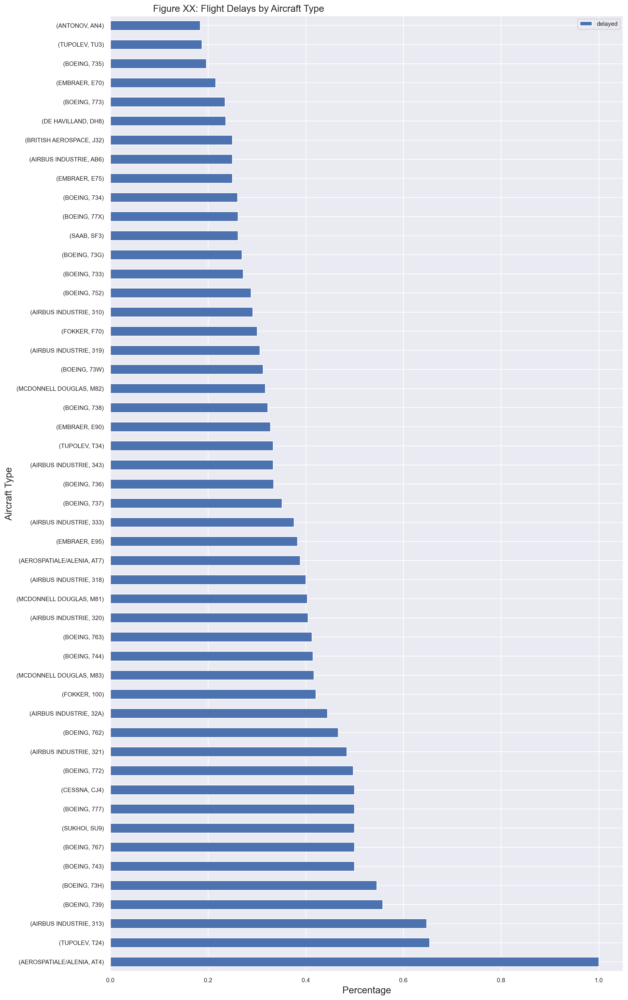

In [180]:
aircraft_rel.sort_values(by='delayed', ascending=False).head(50).plot(kind='barh', rot=0, figsize=(12,24))
plt.title('Figure XX: Flight Delays by Aircraft Type', x = 0.25, fontsize = 14)
plt.ylabel('Aircraft Type', fontsize = 14)
plt.xlabel('Percentage', fontsize = 14)
plt.show()

The graph above shows that **AEROSPATIALE/ALENIA AT4** has relatively the most delays among the aircraft types.  
  
  ***

In [173]:
# What's the service type with the most delays? Absolute
service_abs = delay.groupby('service_type').count().sort_values(by='delayed', ascending=False)[['delayed']]
service_abs

,delayed
service_type,
"Normal Service (Sheduled, Passenger)",29469
"Passenger Only (Charter, Passenger)",2556
"Business Aviation/Air Taxi (Others, Not Specific)",760
Non-revenue (Positioning/Ferry/Delivery/Demo; Not specific),142
"Normal Service (Additional Flights, Passenger)",103
"Cargo and/or Mail (Charter, Cargo/Mai)",86
"General Aviation (Others, Not specific)",40
"Loose loaded cargo and/or preloaded devices(Sheduled,Cargo/Mail)",31
Правительство РФ (ВИП),29


In [174]:
# What's the service type with the most delays? Relative
service_rel = service_abs / df.groupby('service_type').count()[['delayed']]
service_rel.sort_values(by='delayed', ascending=False)

,delayed
service_type,
"Passenger Only (Charter, Passenger)",0.340256
"Military (Others, Not specific)",0.333333
Passenger and Cargo and/or Mail (Charter),0.333333
Non-revenue (Positioning/Ferry/Delivery/Demo; Not specific),0.185137
"Special (FAA/Government; Others, Not specific)",0.176471
"Loose loaded cargo and/or preloaded devices(Sheduled,Cargo/Mail)",0.176136
"Normal Service (Additional Flights, Passenger)",0.175768
"Normal Service (Sheduled, Passenger)",0.172239
State order (Гос.задание),0.155172


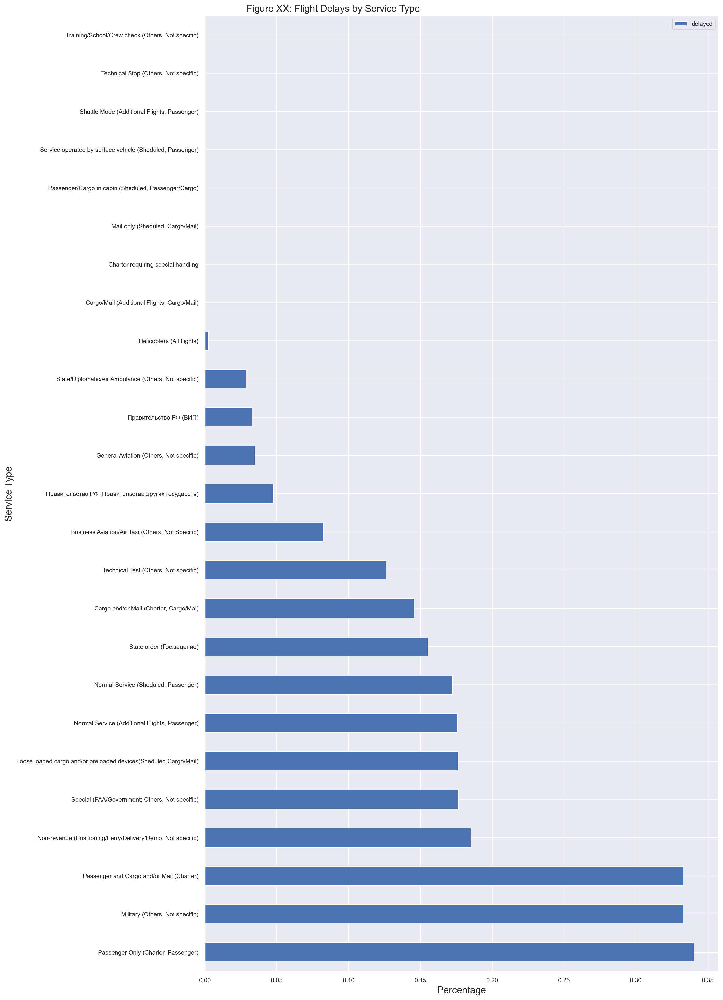

In [179]:
service_rel.sort_values(by='delayed', ascending=False).plot(kind='barh', rot=0, figsize=(12,24))
plt.title('Figure XX: Flight Delays by Service Type', x = 0.25, fontsize = 14)
plt.ylabel('Service Type', fontsize = 14)
plt.xlabel('Percentage', fontsize = 14)
plt.show()

The graph above shows that **Passenger Only - Charter** has relatively the most delays among the service types.  
  
  ***

In [176]:
# Which is the country to which the flight is directed with the most delays? Absolute
country_dep_abs = df[(df.delayed == 1) & (df.departing == 1)].groupby('country_name').count().sort_values(by='delayed', ascending=False)[['delayed']]
country_dep_abs


,delayed
country_name,
RUSSIAN FEDERATION,6138
RUSSIA EAST OF THE URAL MOUNTAINS,1068
UZBEKISTAN,766
GERMANY,620
TURKEY,411
FRANCE,397
UKRAINE,374
GREECE,350
EGYPT,334


In [177]:
# Which is the country to which the flight is directed with the most delays? Relative
country_dep_rel = country_dep_abs / df[df.departing == 1].groupby('country_name').count()[['delayed']]
country_dep_rel.sort_values(by='delayed', ascending=False)


,delayed
country_name,
GEORGIA,1.000000
VIET NAM,0.875000
MEXICO,0.863636
TUNISIA,0.560526
THAILAND,0.475862
...,...
SLOVENIA,NaN
SRI LANKA,NaN
SUDAN,NaN


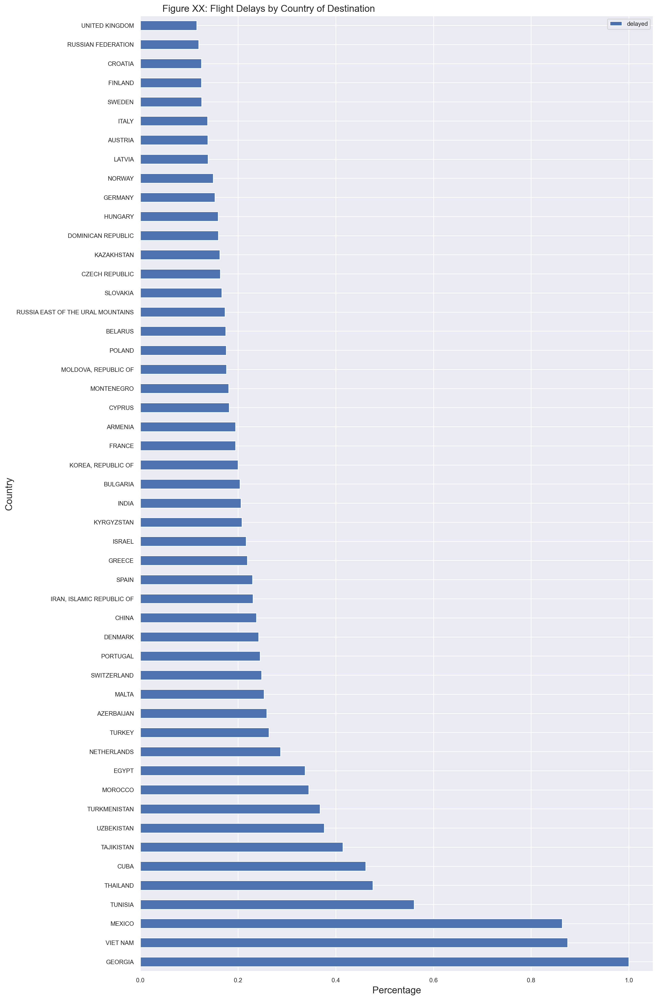

In [178]:
country_dep_rel.sort_values(by='delayed', ascending=False).head(50).plot(kind='barh', rot=0, figsize=(12,24))
plt.title('Figure XX: Flight Delays by Country of Destination', x = 0.25, fontsize = 14)
plt.ylabel('Country', fontsize = 14)
plt.xlabel('Percentage', fontsize = 14)
plt.show()

The graph above shows that flights departing to **Georgia** have relatively the most delays.  
  
  ***

In [185]:
# Which is the country from which the flight arrived with the most delays? Absolute
country_arr_abs = df[(df.delayed == 1) & (df.departing == 0)].groupby('country_name').count().sort_values(by='delayed', ascending=False)[['delayed']]
country_arr_abs


,delayed
country_name,
RUSSIAN FEDERATION,7339
GERMANY,1649
DOMINICAN REPUBLIC,795
FRANCE,766
ITALY,597
...,...
PAKISTAN,1
"IRAN, ISLAMIC REPUBLIC OF",1
GEORGIA,1


In [186]:
# Which is the country from which the flight arrived with the most delays? Relative
country_arr_rel = country_arr_abs / df[df.departing == 0].groupby('country_name').count()[['delayed']]
country_arr_rel.sort_values(by='delayed', ascending=False)


,delayed
country_name,
NETHERLANDS,0.631579
DOMINICAN REPUBLIC,0.563031
HUNGARY,0.500000
GEORGIA,0.500000
QATAR,0.500000
...,...
MAURITIUS,NaN
ROMANIA,NaN
SAUDI ARABIA,NaN


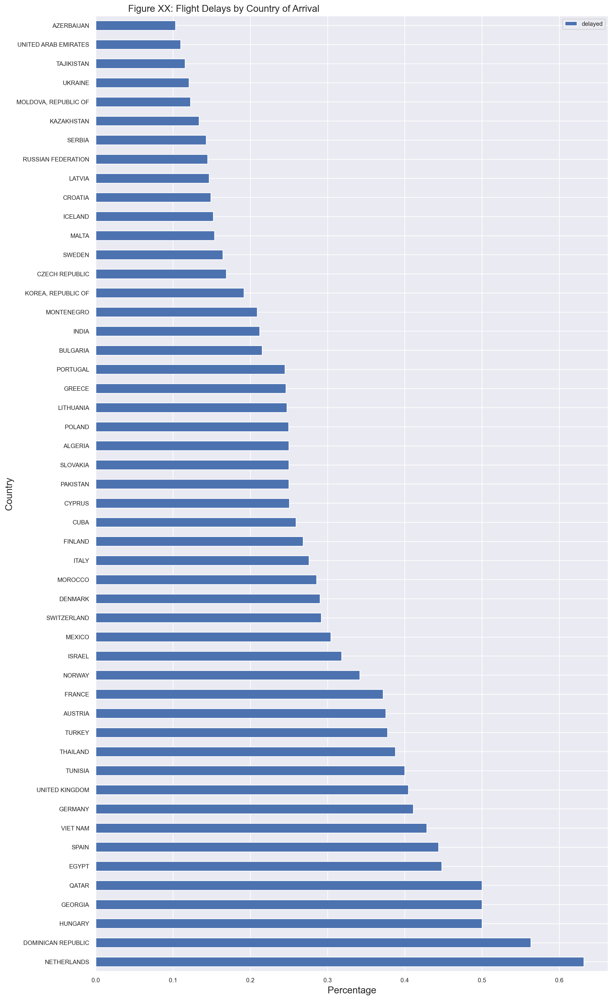

In [187]:
country_arr_rel.sort_values(by='delayed', ascending=False).head(50).plot(kind='barh', rot=0, figsize=(12,24))
plt.title('Figure XX: Flight Delays by Country of Arrival', x = 0.25, fontsize = 14)
plt.ylabel('Country', fontsize = 14)
plt.xlabel('Percentage', fontsize = 14)
plt.show()

The graph above shows that flights arriving from **Netherlands** has relatively the most delays.  
  
  ***

In [188]:
# What's the spot number with the most delays? Absolute
spot_abs = delay.groupby('spot_number').count().sort_values(by='delayed', ascending=False)[['delayed']]
spot_abs

,delayed
spot_number,
66,1638
65,1599
67,1544
36,1454
70,1288
...,...
605D,1
606A,1
608C,1


In [189]:
# What's the spot number with the most delays? Relative
spot_rel = spot_abs / df.groupby('spot_number').count()[['delayed']]
spot_rel.sort_values(by='delayed', ascending=False)

,delayed
spot_number,
93,1.000000
397A,0.916667
104,0.625000
35A,0.518519
94,0.500000
...,...
88B,NaN
89A,NaN
91,NaN


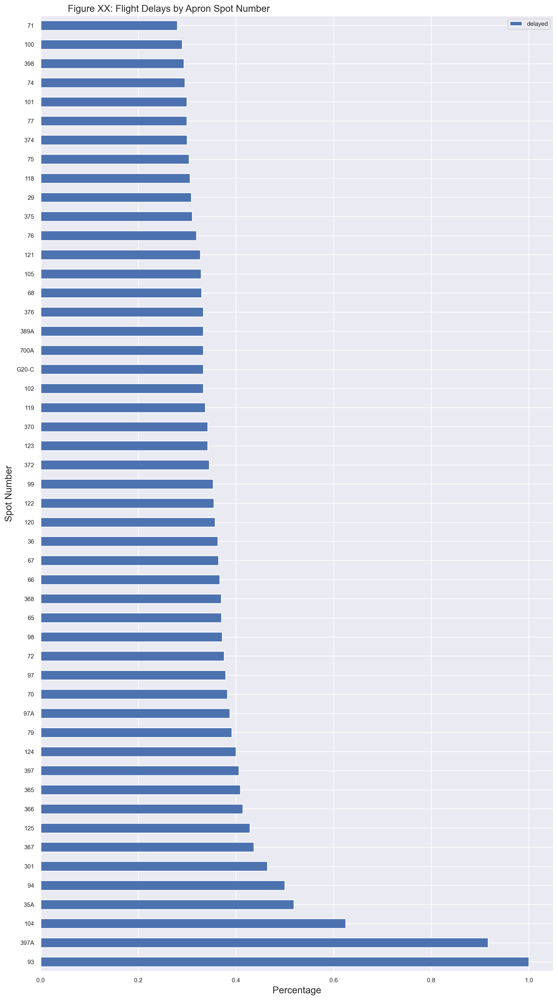

In [190]:
spot_rel.sort_values(by='delayed', ascending=False).head(50).plot(kind='barh', rot=0, figsize=(12,24))
plt.title('Figure XX: Flight Delays by Apron Spot Number', x = 0.25, fontsize = 14)
plt.ylabel('Spot Number', fontsize = 14)
plt.xlabel('Percentage', fontsize = 14)
plt.show()

The graph above shows that **93** has relatively the most delays among the apron spot numbers.  
  
  ***

In [194]:
# How many passenger on average has a delayed flight compared to one without delay?
# delay.groupby('pax_total').count().sort_values(by='delayed', ascending=False)[['delayed']]
pax = df.groupby('delayed')[['pax_total']].mean()
pax

,pax_total
delayed,
0,97.086911
1,122.903605


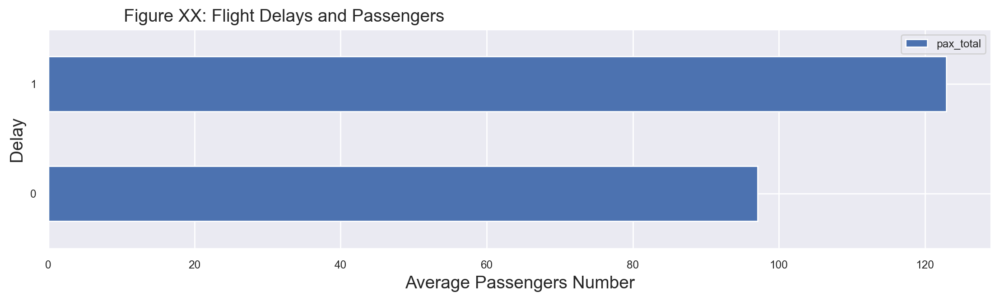

In [198]:
pax.plot(kind='barh', rot=0, figsize=(12,3))
plt.title('Figure XX: Flight Delays and Passengers', x = 0.25, fontsize = 14)
plt.ylabel('Delay', fontsize = 14)
plt.xlabel('Average Passengers Number', fontsize = 14)
plt.show()

The graph above shows that **delayed flights** have higher average passenger numbers than non-delayed flights.  
  
  ***

In [199]:
# What's the average load factor of a delayed flight compared to one without delay?
lf = df.groupby('delayed')[['load_factor']].mean()
lf

,load_factor
delayed,
0,81.961487
1,77.461711


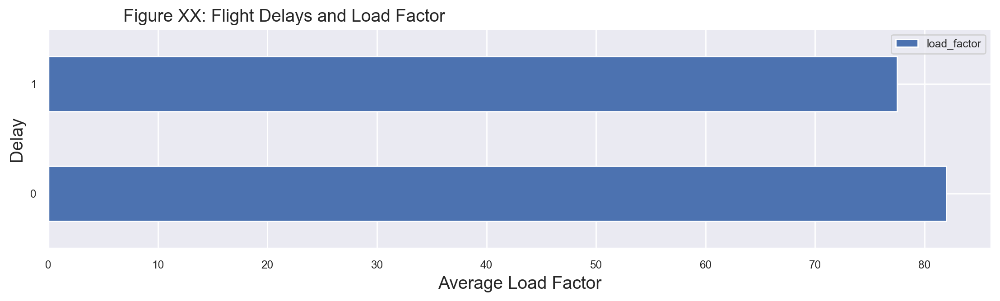

In [200]:
lf.plot(kind='barh', rot=0, figsize=(12,3))
plt.title('Figure XX: Flight Delays and Load Factor', x = 0.25, fontsize = 14)
plt.ylabel('Delay', fontsize = 14)
plt.xlabel('Average Load Factor', fontsize = 14)
plt.show()

The graph above shows that **non-delayed flights** have higher average load factor than delayed flights.  
  
  ***

In [201]:
# What's the average baggage weight of a delayed flight compared to one without delay?
bag = df.groupby('delayed')[['baggage_weight']].mean()
bag

,baggage_weight
delayed,
0,1019.065780
1,1460.758661


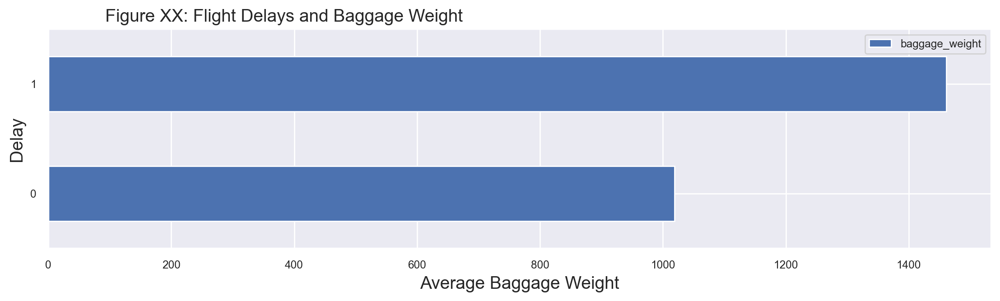

In [202]:
bag.plot(kind='barh', rot=0, figsize=(12,3))
plt.title('Figure XX: Flight Delays and Baggage Weight', x = 0.25, fontsize = 14)
plt.ylabel('Delay', fontsize = 14)
plt.xlabel('Average Baggage Weight', fontsize = 14)
plt.show()

The graph above shows that **delayed flights** have significantly higher average baggage weight than non-delayed flights.  
  
  ***

In [203]:
# What's the average precipitation when a flight is delayed compared to an on-time one?
# delay.groupby('precipitation').count().sort_values(by='delayed', ascending=False)[['delayed']]
precip = df.groupby('delayed')[['precipitation']].mean()
precip

,precipitation
delayed,
0,0.083463
1,0.091088


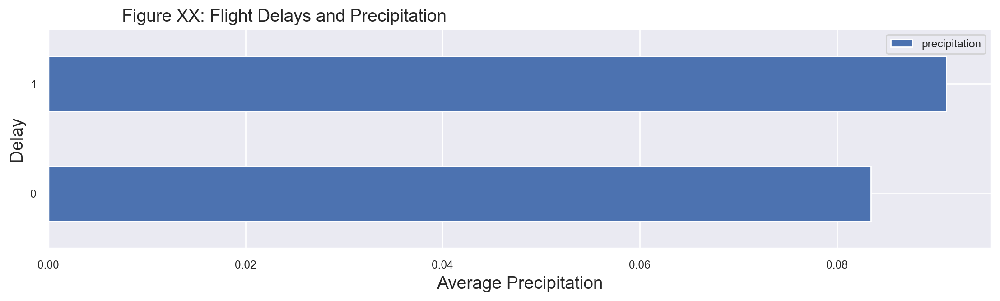

In [207]:
precip.plot(kind='barh', rot=0, figsize=(12,3))
plt.title('Figure XX: Flight Delays and Precipitation', x = 0.25, fontsize = 14)
plt.ylabel('Delay', fontsize = 14)
plt.xlabel('Average Precipitation', fontsize = 14)
plt.show()

The graph above shows that **delayed flights** have higher average precipitation than non-delayed flights.  
  
  ***

In [223]:
# What's the most common weather code when a flight is delayed compared to an on-time one?
# delay.groupby('weather_code').count().sort_values(by='delayed', ascending=False)[['delayed']]
wcode = df.groupby(['weather_code', 'delayed'])[['weather_code']].count()
wcode

weather_code
weather_code delayed              
0            0               30543
             1                6248
1            0               32872
             1                6591
2            0               23256
             1                4745
3            0               47197
             1                9424
51           0               14145
             1                2759
53           0                5498
             1                1158
61           0                2054
             1                 499
63           0                 541
             1                 127
71           0                4686
             1                1316
73           0                1241
             1                 393

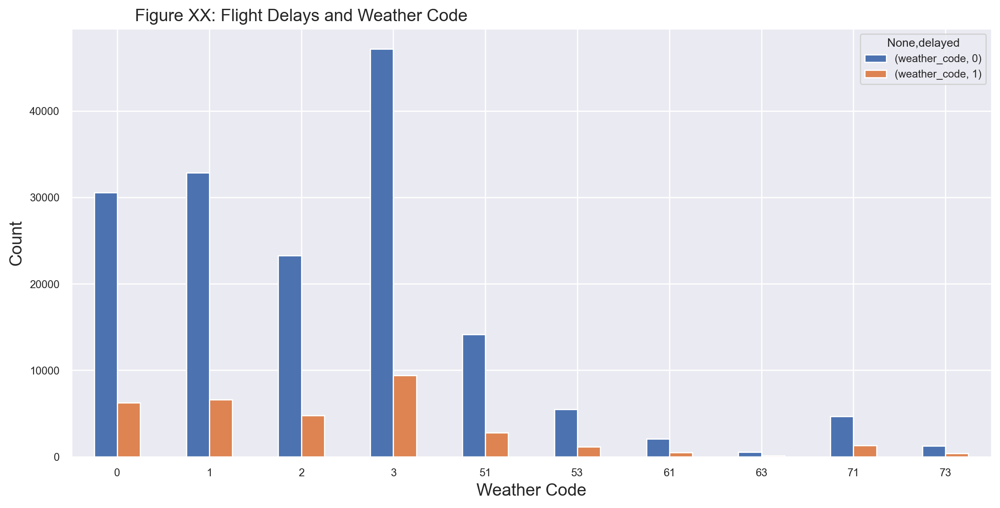

In [224]:
wcode.unstack().plot(kind='bar', rot=0, figsize=(12,6))
plt.title('Figure XX: Flight Delays and Weather Code', x = 0.25, fontsize = 14)
plt.ylabel('Count', fontsize = 14)
plt.xlabel('Weather Code', fontsize = 14)
plt.show()

The graph above shows that both delayed and non-delayed flights have **3** as the most common weather code.  
  
  ***

In [225]:
# What's the average wind speed when a flight is delayed compared to an on-time one?
# delay.groupby('wind_speed').count().sort_values(by='delayed', ascending=False)[['delayed']]
wind = df.groupby('delayed')[['wind_speed']].mean()
wind

,wind_speed
delayed,
0,11.995676
1,11.831293


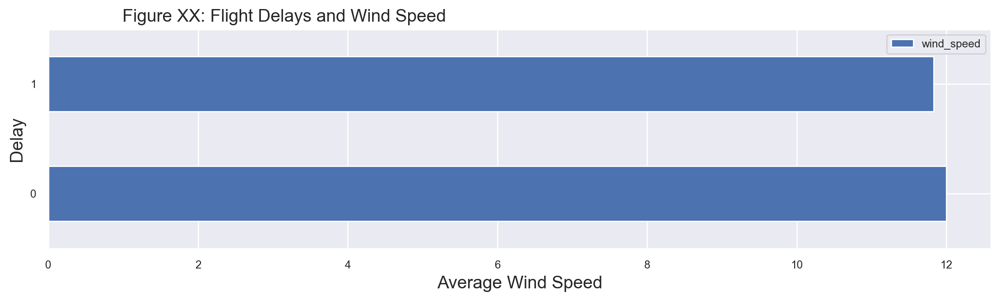

In [226]:
wind.plot(kind='barh', rot=0, figsize=(12,3))
plt.title('Figure XX: Flight Delays and Wind Speed', x = 0.25, fontsize = 14)
plt.ylabel('Delay', fontsize = 14)
plt.xlabel('Average Wind Speed', fontsize = 14)
plt.show()

The graph above shows that **non-delayed flights** have slightly higher average wind speed than non-delayed flights.  
  
  ***

In [114]:
# where are the missing values?
df[df.isnull().sum(axis=1)>0]

,date,year,month,day,hour,departing,terminal_num,airline_code,airline_name,aircraft_type_code,...,load_factor,baggage_weight,mail_weight,temperature,relative_humidity,apparent_temperature,precipitation,weather_code,wind_speed,delayed
0,2013-01-01 03:00,2013,1,1,3,0.0,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",763,...,67.586,3327.0,NaN,0.9,94,-2.4,0.0,3,13.0,0
1,2013-01-01 03:00,2013,1,1,3,0.0,1,OZ,ASIANA AIRLINES,74Y,...,NaN,NaN,NaN,0.9,94,-2.4,0.0,3,13.0,1
2,2013-01-01 05:00,2013,1,1,5,1.0,2,N4,"ООО ""СЕВЕРНЫЙ ВЕТЕР""",763,...,94.667,3224.0,0.0,0.9,94,-2.9,0.0,3,17.0,1
3,2013-01-01 06:00,2013,1,1,6,1.0,1,OZ,ASIANA AIRLINES,74Y,...,NaN,NaN,NaN,0.7,94,-3.3,0.0,3,18.1,0
4,2013-01-01 07:00,2013,1,1,7,0.0,2,LY,EL AL ISRAEL AIRLINES LTD,738,...,8.235,244.0,173.0,0.8,94,-3.6,0.2,71,19.6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195288,2013-12-31 22:00,2013,12,31,22,0.0,1,FV,"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",A81,...,34.667,211.0,0.0,1.2,84,-2.8,0.0,2,16.1,0
195289,2013-12-31 22:00,2013,12,31,22,0.0,1,FV,"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",A81,...,61.333,355.0,0.0,1.2,84,-2.8,0.0,2,16.1,0
195290,2013-12-31 22:00,2013,12,31,22,0.0,1,U6,"ОАО АК ""УРАЛЬСКИЕ АВИАЛИНИИ""",321,...,104.211,2044.0,0.0,1.2,84,-2.8,0.0,2,16.1,1
195291,2013-12-31 22:00,2013,12,31,22,1.0,2,BT,AIR BALTIC,735,...,64.035,334.0,637.0,1.2,84,-2.8,0.0,2,16.1,0


#### At this stage every row has some null values.
Some columns are going to be dropped entirely, while for some others we are going to remove the rows.

***

## Pre-Modelling
Null values need to be removed for the modelling stage.  
Nominal variables need to be dummified.

***

In [3]:
# Loading the data from CSV for consistency reasons
df = pd.read_csv('datasets/mod/df_01.csv', low_memory=False)

In [7]:
df.isnull().sum()

date                         0
year                         0
month                        0
day                          0
weekday                      0
hour                         0
departing                    0
terminal_num             59862
airline_code             11161
airline_name             11353
aircraft_type_code       57936
aircraft_type_name       57936
service_type                 0
domestic                     0
cancelled                    0
regular                      0
CIS_country                  0
country_name                 0
flight_number                4
main_delay_code         162033
source_delay            180400
runway                  126803
spot_number              57927
pax_total                72275
pax_1                        0
pax_2                        0
pax_3                        0
pax_4                        0
pax_5                        0
pax_6                        0
load_factor              12846
baggage_weight           74207
mail_wei

In [8]:
# Dropping columns and rows.
# 1st round
df.drop(columns=['main_delay_code', 'source_delay', 'runway'], inplace=True)
df.shape

(195293, 37)

In [9]:
df.isnull().sum()

date                         0
year                         0
month                        0
day                          0
weekday                      0
hour                         0
departing                    0
terminal_num             59862
airline_code             11161
airline_name             11353
aircraft_type_code       57936
aircraft_type_name       57936
service_type                 0
domestic                     0
cancelled                    0
regular                      0
CIS_country                  0
country_name                 0
flight_number                4
spot_number              57927
pax_total                72275
pax_1                        0
pax_2                        0
pax_3                        0
pax_4                        0
pax_5                        0
pax_6                        0
load_factor              12846
baggage_weight           74207
mail_weight             112335
temperature                  0
relative_humidity            0
apparent

In [10]:
# Dropping columns and rows.
# 2nd round
df.drop(columns=['date', 'flight_number', 'mail_weight'], inplace=True)
df.shape

(195293, 34)

In [11]:
df.isnull().sum()

year                        0
month                       0
day                         0
weekday                     0
hour                        0
departing                   0
terminal_num            59862
airline_code            11161
airline_name            11353
aircraft_type_code      57936
aircraft_type_name      57936
service_type                0
domestic                    0
cancelled                   0
regular                     0
CIS_country                 0
country_name                0
spot_number             57927
pax_total               72275
pax_1                       0
pax_2                       0
pax_3                       0
pax_4                       0
pax_5                       0
pax_6                       0
load_factor             12846
baggage_weight          74207
temperature                 0
relative_humidity           0
apparent_temperature        0
precipitation               0
weather_code                0
wind_speed                  0
delayed   

In [12]:
df[df.isnull().sum(axis=1)>0]
# The row drop operation seems more feasible now

,year,month,day,weekday,hour,departing,terminal_num,airline_code,airline_name,aircraft_type_code,...,pax_6,load_factor,baggage_weight,temperature,relative_humidity,apparent_temperature,precipitation,weather_code,wind_speed,delayed
1,2013,1,1,1,3,0.0,1,OZ,ASIANA AIRLINES,74Y,...,0,NaN,NaN,0.9,94,-2.4,0.0,3,13.0,1
3,2013,1,1,1,6,1.0,1,OZ,ASIANA AIRLINES,74Y,...,0,NaN,NaN,0.7,94,-3.3,0.0,3,18.1,0
7,2013,1,1,1,9,1.0,2,NaN,NaN,CJ3,...,0,NaN,NaN,1.0,92,-3.7,0.1,71,21.0,0
20,2013,1,1,1,12,0.0,2,NaN,NaN,H80,...,0,NaN,NaN,1.1,94,-3.3,0.6,73,19.5,0
21,2013,1,1,1,12,0.0,2,AY,FINNAIR,320,...,0,0.0,NaN,1.1,94,-3.3,0.6,73,19.5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195283,2013,12,31,1,22,1.0,NaN,FV,"ОАО ""АВИАКОМПАНИЯ ""РОССИЯ""",NaN,...,0,100.0,NaN,1.2,84,-2.8,0.0,2,16.1,0
195284,2013,12,31,1,22,0.0,NaN,SU,"ОАО ""АЭРОФЛОТ-РОССИЙСКИЕ АВИАЛИНИИ""",NaN,...,0,100.0,NaN,1.2,84,-2.8,0.0,2,16.1,0
195285,2013,12,31,1,22,0.0,NaN,SU,"ОАО ""АЭРОФЛОТ-РОССИЙСКИЕ АВИАЛИНИИ""",NaN,...,0,100.0,NaN,1.2,84,-2.8,0.0,2,16.1,0
195287,2013,12,31,1,22,0.0,3,NaN,NaN,C30,...,0,NaN,NaN,1.2,84,-2.8,0.0,2,16.1,0


In [13]:
df.dropna(axis=0, how='any', inplace=True)
df.shape

(119613, 34)

In [14]:
df.isnull().sum()

year                    0
month                   0
day                     0
weekday                 0
hour                    0
departing               0
terminal_num            0
airline_code            0
airline_name            0
aircraft_type_code      0
aircraft_type_name      0
service_type            0
domestic                0
cancelled               0
regular                 0
CIS_country             0
country_name            0
spot_number             0
pax_total               0
pax_1                   0
pax_2                   0
pax_3                   0
pax_4                   0
pax_5                   0
pax_6                   0
load_factor             0
baggage_weight          0
temperature             0
relative_humidity       0
apparent_temperature    0
precipitation           0
weather_code            0
wind_speed              0
delayed                 0
dtype: int64

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119613 entries, 0 to 195291
Data columns (total 34 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   year                  119613 non-null  int64  
 1   month                 119613 non-null  int64  
 2   day                   119613 non-null  int64  
 3   weekday               119613 non-null  int64  
 4   hour                  119613 non-null  int64  
 5   departing             119613 non-null  float64
 6   terminal_num          119613 non-null  object 
 7   airline_code          119613 non-null  object 
 8   airline_name          119613 non-null  object 
 9   aircraft_type_code    119613 non-null  object 
 10  aircraft_type_name    119613 non-null  object 
 11  service_type          119613 non-null  object 
 12  domestic              119613 non-null  float64
 13  cancelled             119613 non-null  float64
 14  regular               119613 non-null  float64
 15  

#### Dummification
Nominal variables need to be dummified for the modelling stage.

***

In [16]:
# Dummifyng nominal variables
df_dum = pd.get_dummies(df, drop_first=True)
df_dum

,year,month,day,weekday,hour,departing,domestic,cancelled,regular,CIS_country,...,spot_number_9,spot_number_93,spot_number_94,spot_number_97,spot_number_97A,spot_number_98,spot_number_99,spot_number_G20-A,spot_number_АНГ,spot_number_ЗАВ
0,2013,1,1,1,3,0.0,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,2013,1,1,1,5,1.0,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,2013,1,1,1,7,0.0,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0
5,2013,1,1,1,9,1.0,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0
6,2013,1,1,1,9,1.0,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195286,2013,12,31,1,22,0.0,1.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0
195288,2013,12,31,1,22,0.0,1.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0
195289,2013,12,31,1,22,0.0,1.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0
195290,2013,12,31,1,22,0.0,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [17]:
# Saving the modified dataframe as CSV
df_dum.to_csv('datasets/mod/df_dum.csv', encoding='utf-8', index=False)

## Modelling Push
Quick modelling exercise performed on Friday morning, performed on 20/01/2023

***

In [4]:
# Loading the data from CSV for consistency reasons
df_dum = pd.read_csv('datasets/mod/df_dum.csv', low_memory=False)

In [5]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor, RandomForestClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.tree import export_graphviz


In [6]:
# Defining target and predictors
y = df_dum.pop('delayed')
X = df_dum

#### Baseline accuracy

In [7]:
# Determining baseline accuracy
print('Baseline accuracy:', y.value_counts(normalize=True).max())

Baseline accuracy: 0.7375452500982335


In [8]:
# Splitting the data into a train and a hold-out test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=0)

In [9]:
# Instantiating a standar scaler, fitting on the train set, and transforming both the train and 
# test sets. I fit only on the train set, so that the test set remains 'unseen' data.

scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns) 
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

#### Model Testing 
As my target is categorical, I need to fit a classification model.  
Below I test six different classification models using `sklearn`:

    1. A basic Logistic Regression model  
    2. A K-Nearest Neighbors Classifier  
    3. A Decision Tree Classifier  
    4. A Random Forest Classifier  
    5. An Extra Trees Classifier  
    6. A Support Vector Machine Classifier



In [10]:
# Setting up a function to test different models 
def test_models(models, names, x_train, x_test, y_train, y_test): 
    
    """
    Print test and cross-validated train scores for different models 
    Arguments:
    models: List of models to test
    names: List of model names as strings
    x_train, x_test: x values to train and test the model on
    y_train, y_test: y values to train and test the model on
    """
    
    for model, name in list(zip(models, names)): 
        m = model
        m.fit(x_train, y_train)
        print(name)
        print('Test score:                 ', m.score(x_test, y_test))
        print('Cross validated scores mean:', cross_val_score(m, x_test, y_test, cv=5).mean())
        print('Cross validated scores:     ', cross_val_score(m, x_test, y_test, cv=5))
        print('-'*47)
        print()

In [11]:
models = [LogisticRegression(max_iter=5000), 
          KNeighborsClassifier(n_neighbors=5), 
          DecisionTreeClassifier(criterion='gini', max_depth=5, random_state=1), 
          RandomForestClassifier(max_depth=3, random_state=1),
          ExtraTreesClassifier(n_estimators=100, random_state=1),
          SVC(kernel='rbf', gamma='scale', random_state=1)]

names = ['Logistic Regression', 'KNN Classifier', 'Decision Tree Classifier', 'Random Forest Classifier',
         'Extra Trees Classifier', 'SVM Classifier']

In [26]:
test_models(models, names, X_train, X_test, y_train, y_test)

Logistic Regression
Test score:                  0.7641182125987543
Cross validated scores mean: 0.7619031830238726
Cross validated scores:      [0.76071055 0.75799373 0.75715778 0.7652592  0.76839465]
-----------------------------------------------

KNN Classifier
Test score:                  0.7527902018977553
Cross validated scores mean: 0.7388708967194724
Cross validated scores:      [0.73709509 0.73563218 0.7354232  0.74101171 0.74519231]
-----------------------------------------------

Decision Tree Classifier
Test score:                  0.7520795886803494
Cross validated scores mean: 0.7514948207714325
Cross validated scores:      [0.7460815  0.7523511  0.74545455 0.76045151 0.75313545]
-----------------------------------------------

Random Forest Classifier
Test score:                  0.7375329181122768
Cross validated scores mean: 0.7375329206026359
Cross validated scores:      [0.73751306 0.73751306 0.73751306 0.73766722 0.73745819]
----------------------------------------

#### Best performing model
The best performing model is the **Extra Trees Classifier**.   
We are going to investigate this model further using `GridSearchCV`.
  
  ***

In [12]:
# define hyperparemeters
etc_params = {'n_estimators': [100, 150, 200, 300],
              'criterion': ['gini', 'entropy'],
              'min_samples_leaf': [1, 3, 7],
              'max_features': [10, 50, 'sqrt']}

# define the model 
etc = ExtraTreesClassifier()

# instantiate the grid search 
etc_gridsearch = GridSearchCV(etc,etc_params, n_jobs=10,cv=5, verbose=1, return_train_score=True)

# find the fit in the gridsearch 
etc_gridsearch.fit(X_train, y_train)

Fitting 5 folds for each of 72 candidates, totalling 360 fits


GridSearchCV(cv=5, estimator=ExtraTreesClassifier(), n_jobs=10,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': [10, 50, 'sqrt'],
                         'min_samples_leaf': [1, 3, 7],
                         'n_estimators': [100, 150, 200, 300]},
             return_train_score=True, verbose=1)

In [13]:
etc_gridsearch.param_grid

{'n_estimators': [100, 150, 200, 300],
 'criterion': ['gini', 'entropy'],
 'min_samples_leaf': [1, 3, 7],
 'max_features': [10, 50, 'sqrt']}

In [14]:
etc_gridsearch.best_score_

0.7892360748249556

**Best estimator**

In [15]:
etc_gridsearch.best_estimator_

ExtraTreesClassifier(criterion='entropy', max_features=50, n_estimators=200)

In [16]:
etc_gridsearch.best_params_

{'criterion': 'entropy',
 'max_features': 50,
 'min_samples_leaf': 1,
 'n_estimators': 200}

#### Final Model
We assign the best fit model (`best_estimator_`) to a variable and score it on the train and test data.  

***

In [17]:
model = etc_gridsearch.best_estimator_

print('Extra Trees Classifier')
print('Test score:                 ', model.score(X_test, y_test))
print('Cross validated scores mean:', cross_val_score(model, X_test, y_test, cv=5).mean())
print('Cross validated scores:     ', cross_val_score(model, X_test, y_test, cv=5))

Extra Trees Classifier
Test score:                  0.7922501358525269
Cross validated scores mean: 0.7764076266062773
Cross validated scores:      [0.77805643 0.77638454 0.77617555 0.77403846 0.77926421]


The final test score is **0.79** while the cross validated score is slightly lower at **0.77**.

***

#### Features importance  
One way to understand the model is checking the score given to the different features, where this score represent the importance of each one.  
A higher score means that the specific feature will have a larger effect on the model when predicting a certain variable.  

***

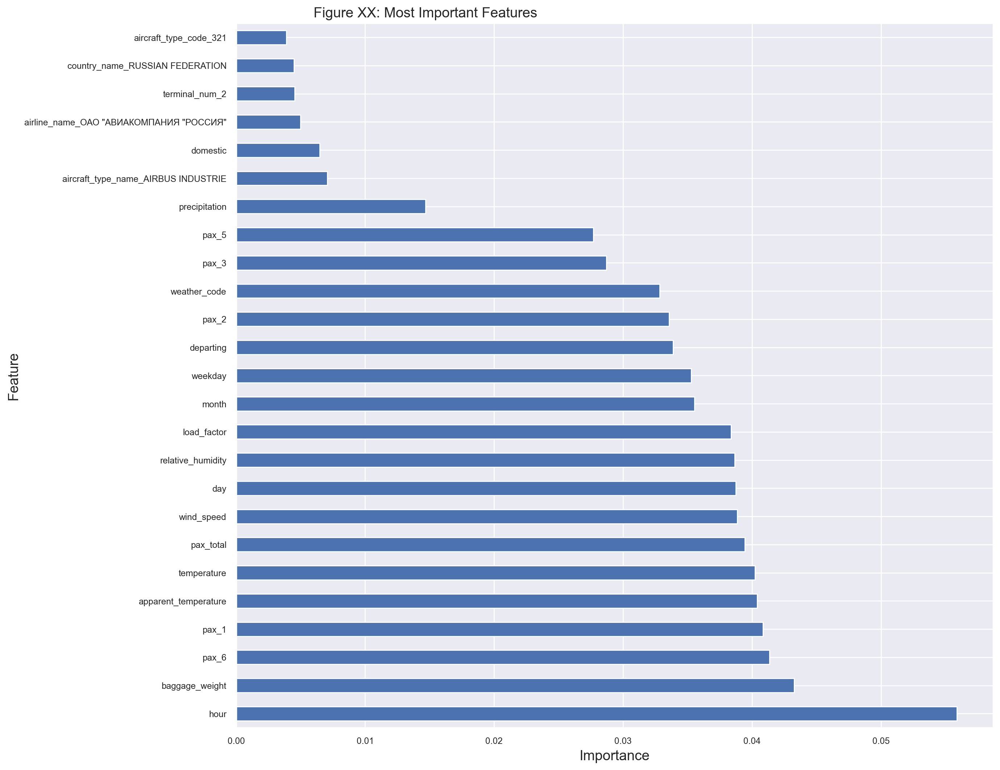

In [34]:
plt.title('Figure XX: Most Important Features', x = 0.25, fontsize = 14)
plt.ylabel('Feature', fontsize = 14)
plt.xlabel('Importance', fontsize = 14)
(pd.Series(model.feature_importances_, index=X.columns)
   .nlargest(25)
   .plot(kind='barh', figsize=(12,12)));

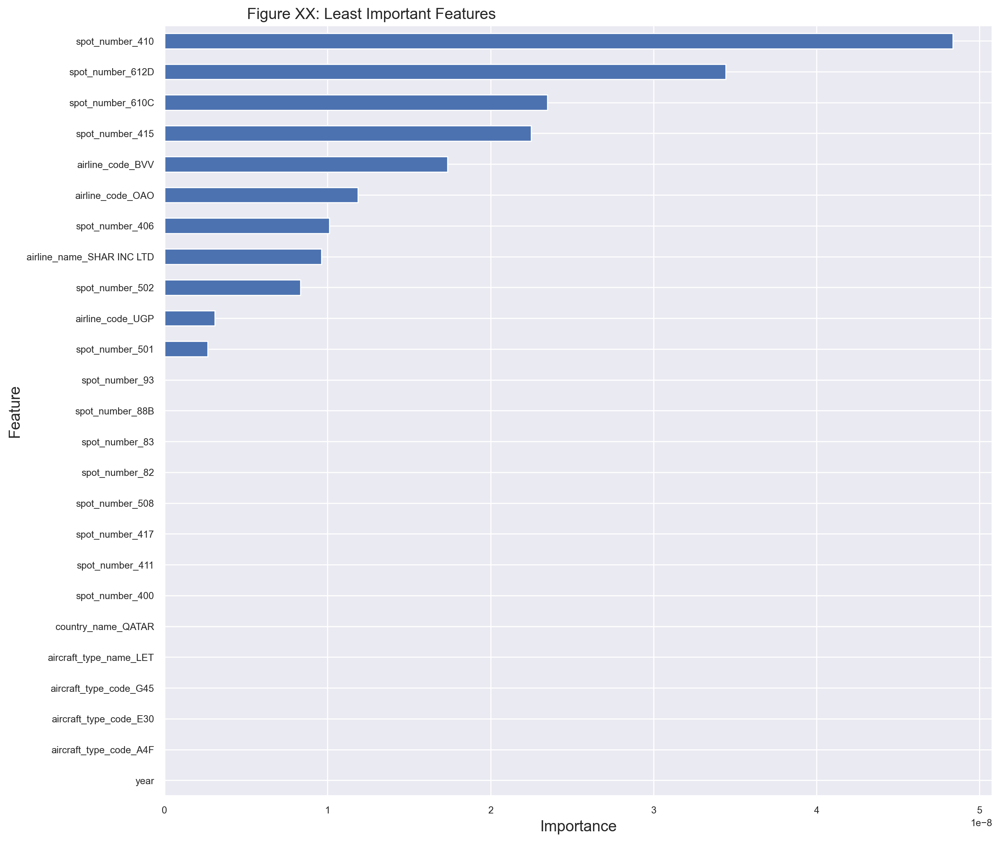

In [36]:
plt.title('Figure XX: Least Important Features', x = 0.25, fontsize = 14)
plt.ylabel('Feature', fontsize = 14)
plt.xlabel('Importance', fontsize = 14)
(pd.Series(model.feature_importances_, index=X.columns)
   .nsmallest(25)
   .plot(kind='barh', figsize=(12,12)));

The most important feature is **hour**, followed by **baggage_weight** and **pax_6**: in general, the most important features are original predictors, rather than dummified ones.
  
  On the other side, the least important feature seems to be **year** (that should have been removed from the predictors because it has always the same value), followed by a few **aircraft_type_code**: we need to consider that we are working with really small numbers here so the difference is probably not meaningful.  
  
  ***

## Model Evaluation

In [18]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import plot_confusion_matrix, classification_report
from sklearn.metrics import roc_auc_score, average_precision_score, plot_roc_curve, plot_precision_recall_curve


In [19]:
pred_train = model.predict(X_train)
pred_test = model.predict(X_test)

#### Confusion Matrix

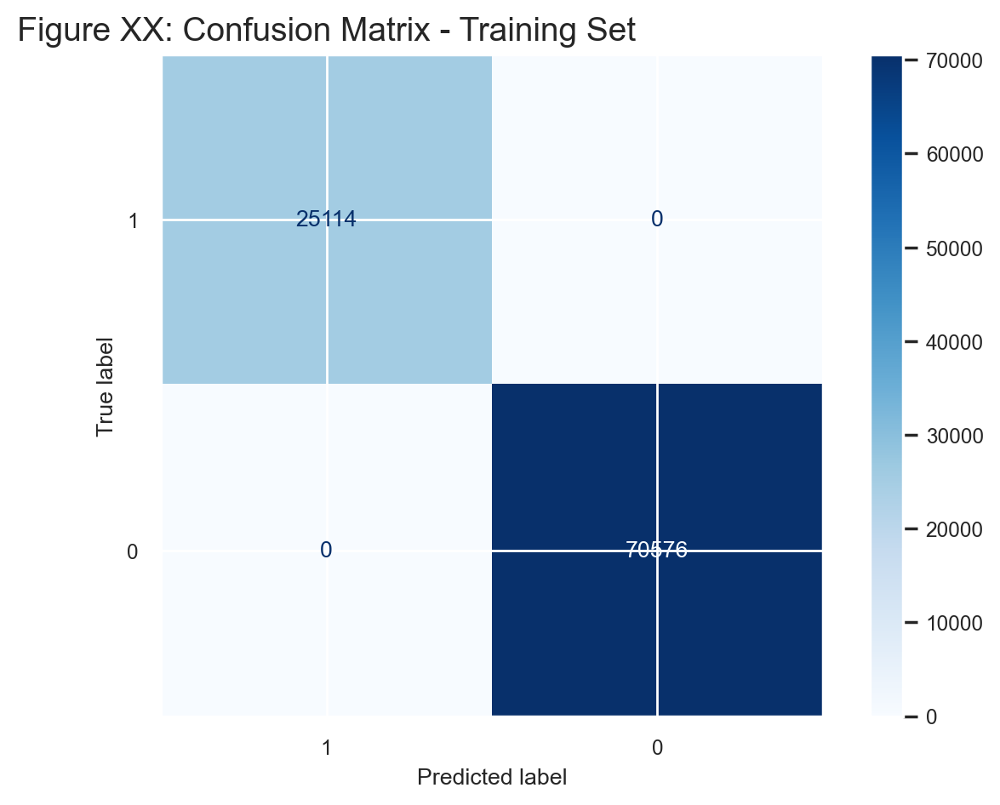

In [20]:
plot_confusion_matrix(model, X_train, y_train, cmap='Blues', labels=[1, 0])
plt.title('Figure XX: Confusion Matrix - Training Set', x = 0.25, fontsize = 14)
plt.show()

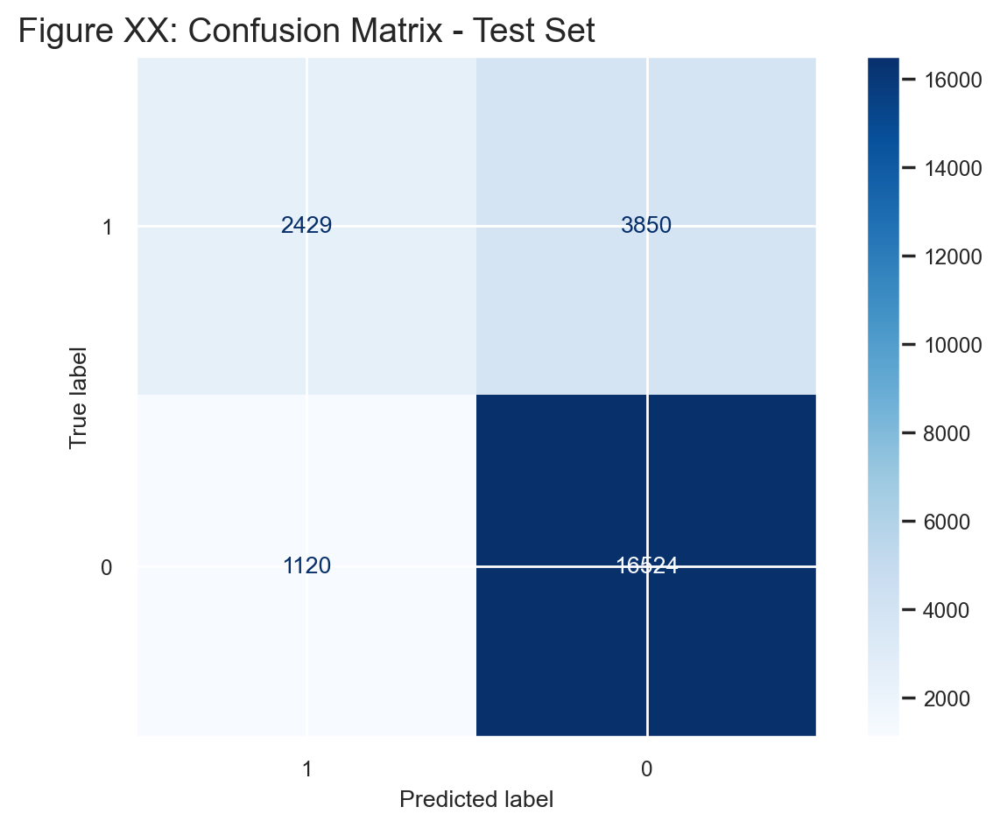

In [21]:
plot_confusion_matrix(model, X_test, y_test, cmap='Blues', labels=[1, 0])
plt.title('Figure XX: Confusion Matrix - Test Set', x = 0.25, fontsize = 14)
plt.show()

We have two rather unbalanced classes (baseline is **0.74**) and the model tends to predict more often the majority class, that in our case is **0** (not delayed).

#### Classification Report

In [22]:
print(classification_report(y_train, pred_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     70576
           1       1.00      1.00      1.00     25114

    accuracy                           1.00     95690
   macro avg       1.00      1.00      1.00     95690
weighted avg       1.00      1.00      1.00     95690



In [23]:
print(classification_report(y_test, pred_test))

              precision    recall  f1-score   support

           0       0.81      0.94      0.87     17644
           1       0.68      0.39      0.49      6279

    accuracy                           0.79     23923
   macro avg       0.75      0.66      0.68     23923
weighted avg       0.78      0.79      0.77     23923



The classification report confirms the unbalanced behaviour of the model.  
The majority class **0** has a good precision score and a very good recall score.  
The minority class **1** has an average precision score and a bad recall score.  

***

#### Receiver Operator Characteristic Curve

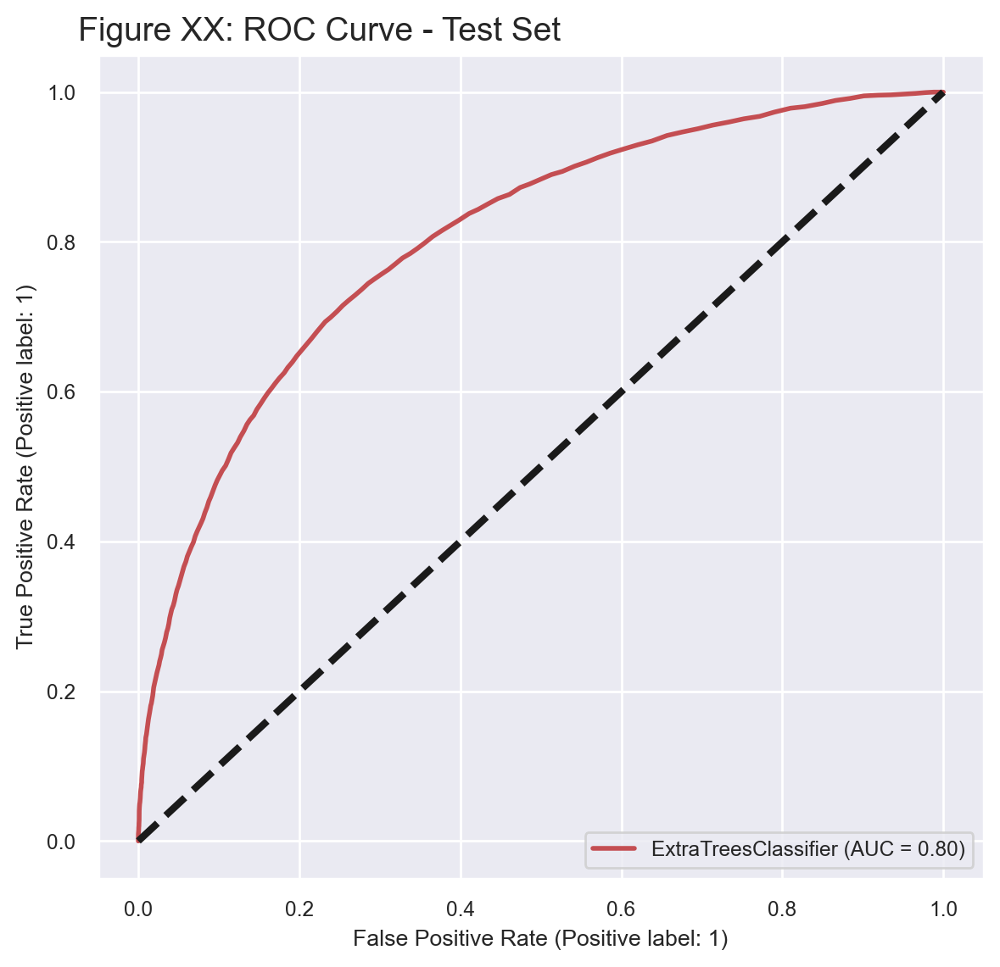

In [24]:
fig, ax = plt.subplots(figsize=(6, 6))
plot_roc_curve(model, X_test, y_test, c='r', lw=2, ax=ax)
plt.title('Figure XX: ROC Curve - Test Set', x = 0.25, fontsize = 14)
ax.plot([0, 1], [0, 1], 'k--', lw=3)
plt.show()

In [25]:
print('ROC-AUC Score:', roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]))

ROC-AUC Score: 0.8044507491135486


A critical step after implementing a machine learning algorithm is to find out how effective our model is based on metrics and datasets.  
  
  
The Confusion Matrix is not entirely a performance metric but provides a basis on which other metrics can evaluate the results.  
In our example it shows clearly that the model is biased towards the **majority class (0)** which is then **overpredicted**.  

The Classification Report confirms the unbalanced behaviour of the model.  
The majority class has a good precision score and a very good recall score.  
The minority class has an average precision score and a bad recall score.  
  
  The ROC-AUC Score is 0.80, which tells us that the model has a fairly good class separation capacity.  
  
  ***




#### Neural Networks try

In [41]:
from sklearn.neural_network import MLPClassifier
from sklearn import metrics

In [42]:
clf = MLPClassifier(solver='adam',
                    alpha=10**(0),
                    hidden_layer_sizes=(8, 8, 8, 8, 8),
                    activation='tanh',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)
clf.fit(X_train, y_train)
print(metrics.accuracy_score(y_test, clf.predict(X_test)))

0.7445554487313464


In [43]:
clf = MLPClassifier(solver='adam',
                    alpha=10**(0),
                    hidden_layer_sizes=(8, 8, 8, 8, 8),
                    activation='relu',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)
clf.fit(X_train, y_train)
print(metrics.accuracy_score(y_test, clf.predict(X_test)))

0.7592693224093968


In [44]:
clf = MLPClassifier(solver='sgd',
                    alpha=10**(0),
                    hidden_layer_sizes=(8, 8, 8, 8, 8),
                    activation='relu',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)
clf.fit(X_train, y_train)
print(metrics.accuracy_score(y_test, clf.predict(X_test)))

0.7375329181122768


In [46]:
clf = MLPClassifier(solver='adam',
                    alpha=10**(0),
                    hidden_layer_sizes=(6, 6, 8, 8, 8, 6, 6),
                    activation='tanh',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)
clf.fit(X_train, y_train)
print(metrics.accuracy_score(y_test, clf.predict(X_test)))

0.7375329181122768


In [48]:
clf = MLPClassifier(solver='adam',
                    alpha=10**(0),
                    hidden_layer_sizes=(8, 8, 8, 8, 8, 8, 8),
                    activation='tanh',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)
clf.fit(X_train, y_train)
print(metrics.accuracy_score(y_test, clf.predict(X_test)))

0.7424654098566233


In [50]:
clf = MLPClassifier(solver='adam',
                    alpha=10**(0),
                    hidden_layer_sizes=(8, 10, 8, 10, 8, 10, 8),
                    activation='tanh',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)
clf.fit(X_train, y_train)
print(metrics.accuracy_score(y_test, clf.predict(X_test)))

0.7448898549513021


In [51]:
clf = MLPClassifier(solver='adam',
                    alpha=10**(0),
                    hidden_layer_sizes=(8, 10, 12, 10, 12, 10, 8),
                    activation='tanh',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)
clf.fit(X_train, y_train)
print(metrics.accuracy_score(y_test, clf.predict(X_test)))

0.749864147473143


In [54]:
clf = MLPClassifier(solver='adam',
                    alpha=10**(0),
                    hidden_layer_sizes=(12, 12, 12, 12, 12),
                    activation='tanh',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)
clf.fit(X_train, y_train)
print(metrics.accuracy_score(y_test, clf.predict(X_test)))

0.7375329181122768
